In [3]:
import torch
import torch.optim as optim
import numpy as np
import random
import plotly
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LogNorm
import seaborn as sns
random.seed(2023)
np.random.seed(2023)
torch.manual_seed(2023)

# random support from Roan's code

def transpose_trop_mult(a, b, args=False):
    # we calculate (ab)_{ij} = sum a_jk b_ik
    if a.shape[1] == b.shape[1]:
        if args:
            # We calculate c_{ijk} = a_{jk} + b_{ik}
            c = a[np.newaxis, :, :] + b[:, np.newaxis, :]
            # We find the maximal k
            index = np.nanargmax(c, axis=2)
            prod = np.array([[c[i, j, index[i, j]] for j in range(a.shape[0])] for i in range(b.shape[0])])
            return prod, index
        else:
            prod = np.nanmax(a[np.newaxis, :, :] + b[:, np.newaxis, :], axis=2)
            return prod
    else:
        print('Matrix shapes do not match')

def rand_supp(N, M):
    #Generating a random map
    permutation = np.random.permutation(range(N)).tolist()
    coords = list(range(M)) + list(np.random.choice(range(M), N-M))

    supp = [set() for n in range(M)]

    for n in range(N):
        supp[coords[n]].add(permutation[n])
    
    return supp

def SuppToMatrix(supp, N, M):
    Map = np.full((M, N), np.nan)
    for i in range(M):
        for j in supp[i]:
            Map[i, j] = 0
    return Map


##################################Pytorch Part
# my_inf = torch.const(-1e^11)
def trop_mul(a, supp, Mat):
    # this function returns the tropical multiplication of matrix
    M = len(supp)
    b = torch.zeros(M)
    for i in range(M):
        row_supp = sorted(supp[i])
        num_supp = len(row_supp)
        row = torch.zeros(num_supp)
        for j in range(num_supp):
            row[j] = Mat[row_supp[j]]+a[row_supp[j]]
        b[i] = torch.max(row)
    return b

# Define the objective function
def objective_function(X, Y, supp, Mat, p):
    # X is input data of dim N
    # Y is output data of dim M
    
    num_data = len(X)
    obj_func = 0
    
    for i in range(num_data):
        Z = Y[i,:]-trop_mul(X[i,:], supp, Mat)
        obj_func += torch.sum((torch.max(Z) - torch.min(Z))**p)/num_data
    
    return obj_func

# Define the objective function
def objective_function_infty(X, Y, supp, Mat):
    # X is input data of dim N
    # Y is output data of dim M
    
    num_data = len(X)
    obj_func = 0
    norms = torch.zeros(len(X))
    
    for i in range(num_data):
        Z = Y[i,:]-trop_mul(X[i,:], supp, Mat)
        norms[i] = (torch.max(Z) - torch.min(Z))
    obj_func = torch.max(norms)
    
    return obj_func

# Define the identity matrix w.r.t given supp
def IdProj(X, supp):
    M = len(supp)
    [n, N] = X.size()
    Y = torch.zeros(n, M)
    IdMat = torch.zeros(N)
    for i in range(n):
        Y[i,:] = trop_mul(X[i,:], supp, IdMat)
        
    return Y 

def trop_dist(x,y):

    return torch.max(x-y, dim=1).values - torch.min(x-y,dim=1).values

In [4]:
# Defining projections for visualisations
def proj(X):
    proj_mat = torch.tensor([[1, -0.5, -0.5],[0, np.sqrt(3)/2, -np.sqrt(3)/2]],dtype = torch.double)
    return torch.matmul(proj_mat, X)/torch.sqrt(torch.tensor(1.5))

def rev_proj(X):
    rev_proj_mat = torch.tensor([[1, 0],[-1/2, np.sqrt(3)/2],[-1/2, -np.sqrt(3)/2]],dtype = torch.double)
    return torch.t(torch.matmul(rev_proj_mat, X)/torch.sqrt(torch.tensor(1.5)))

# Experiments Using Different PyTorch Optimizers

We want to optimize elements in the tropical matrix $M$ to minimize the objective function:
$$
\mathrm{obj}(t) = \sum_{i=1}^n\|Y_i-M\odot X_i\|_{tr}^p = \sum_{i=1} (Y_{ij} - t_{ik} - X_{ik})^p
$$
given the support for $M$. So $obj$ continuous, piecewise polynomial, generally not convex.

Three optimizers are tested:
- Adam
- SGD
- RMSprop
- TGD
- TropAdam
- STGD

In [37]:
# Set learning rate and number of iterations
n = 20 # number of data
N = 5 # input dimension
M = 3 # output dimension
learning_rate = 0.01
num_iterations = 200
momentum = 0.1 #default is 0, range [0,1]

# Initialize variables
supp = rand_supp(N, M)
Mat_Init = np.random.rand(N)

# Generate random test data
X = torch.randn(n, N)
Y = torch.randn(n, M)

In [3]:
## Using Adam optimizer

# Lists to store loss and gradient values
Adam_loss_values = []
Mat = torch.tensor(Mat_Init,requires_grad=True)

# Create the optimizer
optimizer = optim.Adam([Mat], lr=learning_rate)

# Perform gradient descent
for i in range(num_iterations):
    # Compute the objective function
    loss = objective_function(X, Y, supp, Mat, 2)
    
    Adam_loss_values.append(loss.item())
    
    # Zero out the gradients
    optimizer.zero_grad()

    # Compute gradients
    loss.backward()
    
    # Update variables using the optimizer
    optimizer.step()

print("Mat =", Mat.detach().numpy())

Mat = [ 1.32263537  0.41911097  0.36694168 -0.37139377  1.48775144]


In [4]:
## Using SGD optimizer

# Lists to store loss and gradient values
SGD_loss_values = []
Mat = torch.tensor(Mat_Init,requires_grad=True)

# Create the optimizer
optimizer = optim.SGD([Mat], lr=learning_rate, momentum=momentum)

# Perform gradient descent
for i in range(num_iterations):
    # Compute the objective function
    loss = objective_function(X, Y, supp, Mat, 2)
    
    # Zero out the gradients
    optimizer.zero_grad()
    
    SGD_loss_values.append(loss.item())

    # Compute gradients
    loss.backward()
    
    # Update variables using the optimizer
    optimizer.step()
    
print("Mat =", Mat.detach().numpy())

Mat = [ 1.21366798  0.23678683  0.18283135 -0.47817297  1.378933  ]


In [5]:
## Using RMSprop optimizer

# Lists to store loss and gradient values
RMSprop_loss_values = []
Mat = torch.tensor(Mat_Init,requires_grad=True)

# Create the optimizer
optimizer = optim.RMSprop([Mat], lr=learning_rate)

# Perform gradient descent
for i in range(num_iterations):
    # Compute the objective function
    loss = objective_function(X, Y, supp, Mat, 2)
    
    # Zero out the gradients
    optimizer.zero_grad()
    
    RMSprop_loss_values.append(loss.item())

    # Compute gradients
    loss.backward()
    
    # Update variables using the optimizer
    optimizer.step()
    
print("Mat =", Mat.detach().numpy())

Mat = [ 1.33626938  0.56368196  0.10492462 -0.35415522  1.51354348]


In [6]:
## Using Tropical Gradient Descent optimizer

# Lists to store loss and gradient values
TGD_loss_values = []
Mat = torch.tensor(Mat_Init,requires_grad=True)

# Create the optimizer

# Perform gradient descent
for i in range(num_iterations):
    # Compute the objective function
    loss = objective_function(X, Y, supp, Mat, 2)
    
    TGD_loss_values.append(loss.item())

    # Compute gradients
    loss.backward()

    #Taking Tropical Gradient Step
    Mat.data = Mat.data - learning_rate * (Mat.grad.data > 0) * (max(Mat.grad.data) - min(Mat.grad.data))
    
    # Zero out the gradients
    Mat.grad.data.zero_()

print("Mat =", Mat.detach().numpy())

Mat = [ 0.52864173 -0.67619116 -0.68118546 -1.11891009  0.67173608]


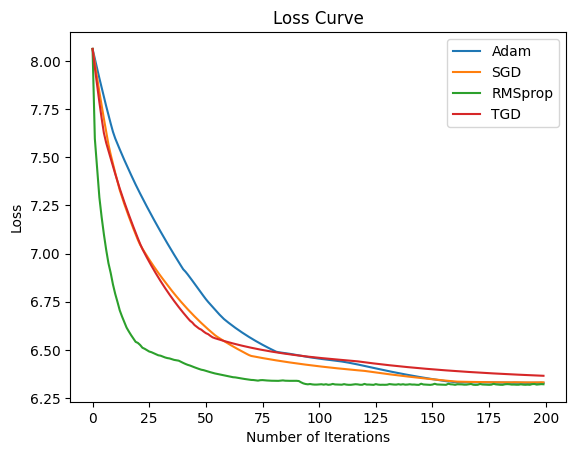

In [7]:
#Plotting loss curves
import matplotlib.pyplot as plt
plt.figure()
plt.plot(Adam_loss_values, label="Adam")
plt.plot(SGD_loss_values, label="SGD")
plt.plot(RMSprop_loss_values, label="RMSprop")
plt.plot(TGD_loss_values, label="TGD")
plt.legend()
plt.xlabel("Number of Iterations")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.show()

## Examples

In [85]:
def loss_example(X,A,B,C):
    return torch.maximum(torch.maximum(torch.dot(A,X),torch.dot(B,X)),torch.dot(C,X))

In [112]:
def loss_example(X,A,B,C):
    return torch.maximum(X[0]+X[1], 2*X[2]) - torch.maximum(torch.maximum(X[0]+X[1], 2*X[2]), X[0]+X[2]) + X[2]

In [122]:
def loss_example(X,A,B,C,D):
    return torch.maximum(torch.maximum(torch.maximum(torch.dot(A,X),torch.dot(B,X)),torch.dot(C,X)), torch.dot(D,X))

In [117]:
def loss_example(X,A,B,C):
    Acoordi = torch.argmin(X+A)
    a_val = torch.min(X[Acoordi]+A[Acoordi]- X - A)
    Bcoordi = torch.argmin(X+B)
    b_val = torch.min(X[Bcoordi]+B[Bcoordi]- X - B)
    Ccoordi = torch.argmin(X+C)
    c_val = torch.min(X[Ccoordi]+C[Ccoordi]- X - C)
    return - torch.maximum(torch.maximum(a_val, b_val), c_val)

In [136]:
## Using Tropical Gradient Descent optimizer

# Lists to store loss and gradient values
TGD_loss_values = []
init = np.random.rand(3)*5
X1 = torch.tensor(init,dtype = float,requires_grad=True)
X2 = torch.tensor(init,dtype = float,requires_grad=True)
X3 = torch.tensor(init,dtype = float,requires_grad=True)

A = torch.tensor([3.5, -2.5, -1],dtype = float, requires_grad=False)
B = torch.tensor([-0.33, 2.67, -2.33],dtype = float,requires_grad=False)
C = torch.tensor([0.83, -3.17, 2.33],dtype = float,requires_grad=False)

C1 = torch.tensor([5, 6,-1],dtype = float, requires_grad=False)
C2 = torch.tensor([5, 1,-6],dtype = float, requires_grad=False)
C3 = torch.tensor([-3, 2,1],dtype = float, requires_grad=False)
C4 = torch.tensor([3, -1,-2],dtype = float, requires_grad=False)

Bad_Boundary_Example_X_Values1 = []
Bad_Boundary_Example_X_Values2 = []
Bad_Boundary_Example_X_Values3 = []

Bad_Boundary_Example_X_Values1.append(proj(torch.tensor(np.transpose(X1.data),dtype = torch.double)))
Bad_Boundary_Example_X_Values2.append(proj(torch.tensor(np.transpose(X2.data),dtype = torch.double)))
Bad_Boundary_Example_X_Values3.append(proj(torch.tensor(np.transpose(X3.data),dtype = torch.double)))

# Create the optimizer

# Perform gradient descent
for i in range(500):
    # Compute the objective function
    loss1 = loss_example(X1,C1,C2,C3,C4)
    loss2 = loss_example(X2,C1,C2,C3,C4)
    loss3 = loss_example(X3,C1,C2,C3,C4)

    # Compute gradients
    loss1.backward()
    loss2.backward()
    loss3.backward()

    X1.data = X1.data - 3*(X1.grad.data)/((i+1)*torch.norm(X1.grad.data,2))

    #Taking Tropical Gradient Step
    coord = torch.argmax(X2.grad.data)
    X2.data[coord] = X2.data[coord] - 3 /(i+1) # * (X.grad.data > 0) * (max(X.grad.data) - min(X.grad.data))

    X3.data = X3.data - 3*(X3.grad.data > 0) /(i+1)

    Bad_Boundary_Example_X_Values1.append(proj(torch.tensor(np.transpose(X1.data),dtype = torch.double)))
    Bad_Boundary_Example_X_Values2.append(proj(torch.tensor(np.transpose(X2.data),dtype = torch.double)))
    Bad_Boundary_Example_X_Values3.append(proj(torch.tensor(np.transpose(X3.data),dtype = torch.double)))
    
    # Zero out the gradients
    X1.grad.data.zero_()
    X2.grad.data.zero_()
    X3.grad.data.zero_()

print("Mat =", X.detach().numpy())

C:\Users\rst17\AppData\Local\Temp\ipykernel_28220\638689462.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Bad_Boundary_Example_X_Values1.append(proj(torch.tensor(np.transpose(X1.data),dtype = torch.double)))
C:\Users\rst17\AppData\Local\Temp\ipykernel_28220\638689462.py:24: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Bad_Boundary_Example_X_Values2.append(proj(torch.tensor(np.transpose(X2.data),dtype = torch.double)))
C:\Users\rst17\AppData\Local\Temp\ipykernel_28220\638689462.py:25: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  B

Mat = [-0.10716219 -0.12128414 -0.11015836]


In [124]:
# Calculating p=2 objective
Objective_example = np.zeros([200,200])

A = torch.tensor([3.5, -2.5,-1],dtype = float, requires_grad=False)
B = torch.tensor([-0.33, 2.67, -2.33],dtype = float,requires_grad=False)
C = torch.tensor([0.83, -3.17, 2.33],dtype = float,requires_grad=False)

C1 = torch.tensor([5, 6,-1],dtype = float, requires_grad=False)
C2 = torch.tensor([5, 1,-6],dtype = float, requires_grad=False)
C3 = torch.tensor([-3, 2,1],dtype = float, requires_grad=False)
C4 = torch.tensor([3, -1,-2],dtype = float, requires_grad=False)

for t1 in range(200):
    for t2 in range(200):

        Objective_example[t1,t2] = loss_example(rev_proj(torch.tensor([t1/5-20, t2/5-20],dtype = torch.double)),C1,C2,C3,C4)

In [137]:
Bad_Boundary_Example_X_Values1 = np.array(Bad_Boundary_Example_X_Values1)
Bad_Boundary_Example_X_Values2 = np.array(Bad_Boundary_Example_X_Values2)
Bad_Boundary_Example_X_Values3 = np.array(Bad_Boundary_Example_X_Values3)

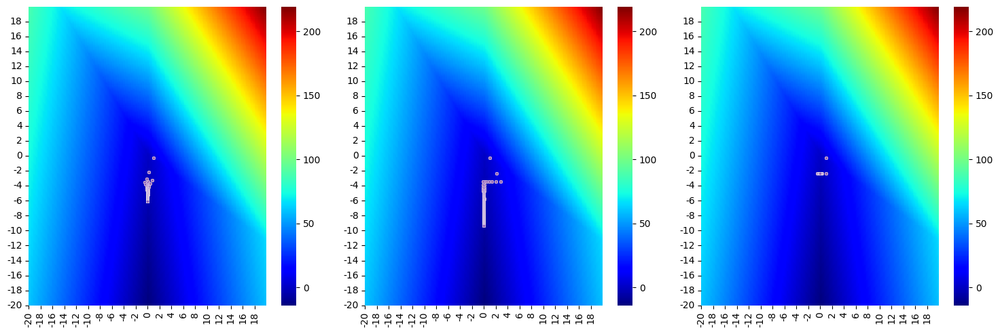

In [138]:
#Plotting steepest descent for p=inf optimiser
fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.tight_layout()

for i in range(3):
     sns.heatmap(np.transpose(Objective_example[0:200,0:200]), cmap = 'jet', ax=ax[i])
     ax[i].axes.invert_yaxis()
     ax[i].set_xticks(range(0,200,10))
     ax[i].set_xticklabels(f'{c}' for c in np.arange(-20,20,2))
     ax[i].set_yticks(range(0,200,10))
     ax[i].set_yticklabels(f'{c}' for c in np.arange(-20,20,2))

for i in range(5):
     sns.scatterplot(x = (20+Bad_Boundary_Example_X_Values1[:,0])*5, y = (Bad_Boundary_Example_X_Values1[:,1]+20)*5, s=10, ax = ax[0])
     sns.scatterplot(x = (20+Bad_Boundary_Example_X_Values2[:,0])*5, y = (Bad_Boundary_Example_X_Values2[:,1]+20)*5, s=10, ax = ax[1])
     sns.scatterplot(x = (20+Bad_Boundary_Example_X_Values3[:,0])*5, y = (Bad_Boundary_Example_X_Values3[:,1]+20)*5, s=10, ax = ax[2])

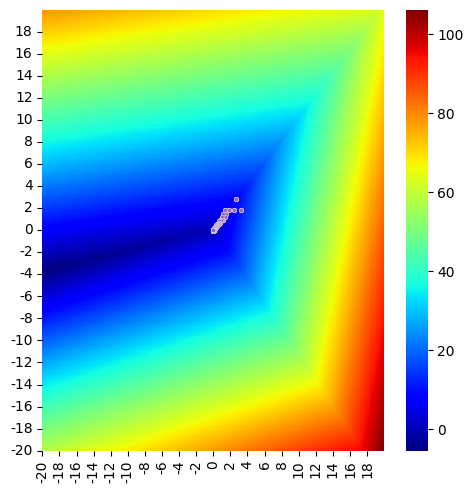

In [76]:
#Plotting steepest descent for p=inf optimiser
fig, ax = plt.subplots(1,1, figsize=(5,5))
fig.tight_layout()

sns.heatmap(np.transpose(Objective_example[0:200,0:200]), cmap = 'jet', ax=ax)
ax.axes.invert_yaxis()
ax.set_xticks(range(0,200,10))
ax.set_xticklabels(f'{c}' for c in np.arange(-20,20,2))
ax.set_yticks(range(0,200,10))
ax.set_yticklabels(f'{c}' for c in np.arange(-20,20,2))

for i in range(5):
     sns.scatterplot(x = (20+Example_X_Values[:,0])*5, y = (Example_X_Values[:,1]+20)*5, s=10, ax = ax)
#     sns.scatterplot(x = (20+Inf_L2GD_Mat_Values[i][0,:])*5, y = (Inf_L2GD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[1])
#     sns.scatterplot(x = (20+Inf_TGD_Mat_Values[i][0,:])*5, y = (Inf_TGD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[2])

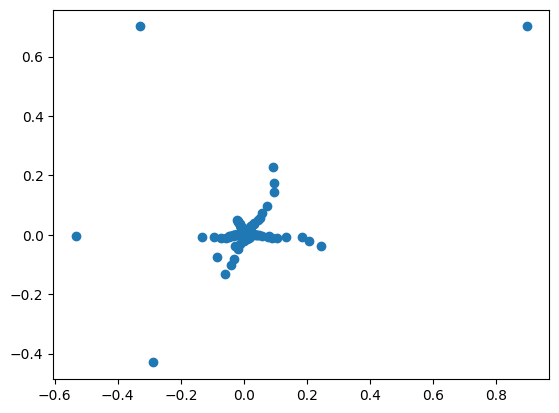

In [72]:
plt.scatter(Example_X_Values[:,0],Example_X_Values[:,1])

# Objective Visualisations

In [359]:
#Setting hyperparameters

num_exps = 15 # number of experiments
n = 10 # number of data
N = 3 # input dimension
M = 2 # ouput dimension
lr = 5
num_iter = 300
tol_loss = 1e-4
tol_mat = 1e-5
data_scale = 8
init_scale = 20
No_grad_types = 3
p = 2
labels = ['L1', 'L2', 'TR']

X = torch.tensor([[2, -3, 0], [0,0,0],[-3,2,0]])*2.5
Y = torch.tensor([[0, 0], [0,0],[0,0]])*2.5

# X = torch.randn(5, 3)*data_scale
# Y = torch.randn(5, 2)*data_scale
supp = [{2}, {0,1}]

In [13]:
#Defining Steepest Descent functions L1GD, infL1GD, L2GD, infL2GD, TSD, infTSD
#TODO:change convergence criteria so tol_mat checks for stagnation in matrix and tol_loss checks for reaching 0.

def L1GD(X, Y, supp, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        L1GD_loss_values = []
        L1GD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        if verbose:
            L1GD_loss_values.append(loss.item())
            L1GD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        grad = torch.zeros(len(Mat.data))
        grad[torch.argmax(torch.abs(Mat.grad.data))] = torch.sign(Mat.grad.data[torch.argmax(torch.abs(Mat.grad.data))])
        Mat.data = Mat.data - lr * grad /(i+1)
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(L1GD_loss_values[-1] - L1GD_loss_values[-2]) < tol_loss) and (np.abs(L1GD_loss_values[-2] - L1GD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, L1GD_loss_values, L1GD_Mat_values
    else:
        return step, loss.item()
    
def infL1GD(X, Y, supp, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        L1GD_loss_values = []
        L1GD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            L1GD_loss_values.append(loss.item())
            L1GD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        grad = torch.zeros(len(Mat.data))
        grad[torch.argmax(torch.abs(Mat.grad.data))] = torch.sign(Mat.grad.data[torch.argmax(torch.abs(Mat.grad.data))])
        Mat.data = Mat.data - lr * grad /(i+1)
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(L1GD_loss_values[-1] - L1GD_loss_values[-2]) < tol_loss) and (np.abs(L1GD_loss_values[-2] - L1GD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, L1GD_loss_values, L1GD_Mat_values
    else:
        return step, loss.item()
    
def L2GD(X, Y, supp, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        L2GD_loss_values = []
        L2GD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        if verbose:
            L2GD_loss_values.append(loss.item())
            L2GD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        Mat.data = Mat.data - lr * (Mat.grad.data)/ (torch.linalg.norm(Mat.grad.data, ord = 2)*(i+1))
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(L2GD_loss_values[-1] - L2GD_loss_values[-2]) < tol_loss) and (np.abs(L2GD_loss_values[-2] - L2GD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, L2GD_loss_values, L2GD_Mat_values
    else:
        return step, loss.item()
    
def infL2GD(X, Y, supp, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        L2GD_loss_values = []
        L2GD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            L2GD_loss_values.append(loss.item())
            L2GD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        Mat.data = Mat.data - lr * (Mat.grad.data)/ (torch.linalg.norm(Mat.grad.data, ord = 2)*(i+1))
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(L2GD_loss_values[-1] - L2GD_loss_values[-2]) < tol_loss) and (np.abs(L2GD_loss_values[-2] - L2GD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, L2GD_loss_values, L2GD_Mat_values
    else:
        return step, loss.item()
    
def TSD(X, Y, supp, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        TGD_loss_values = []
        TGD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        if verbose:
            TGD_loss_values.append(loss.item())
            TGD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        Mat.data = Mat.data - lr * (Mat.grad.data > 0).float()/(i+1)
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(TGD_loss_values[-1] - TGD_loss_values[-2]) < tol_loss) and (np.abs(TGD_loss_values[-2] - TGD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, TGD_loss_values, TGD_Mat_values
    else:
        return step, loss.item()
    
def infTSD(X, Y, supp, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        TGD_loss_values = []
        TGD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            TGD_loss_values.append(loss.item())
            TGD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        Mat.data = Mat.data - lr * (Mat.grad.data > 0).float()/(i+1)
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(TGD_loss_values[-1] - TGD_loss_values[-2]) < tol_loss) and (np.abs(TGD_loss_values[-2] - TGD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, TGD_loss_values, TGD_Mat_values
    else:
        return step, loss.item()

In [360]:
# Calculating p=2 objective
Objective = np.zeros([200,200])

for t1 in range(200):
    for t2 in range(200):

        Objective[t1,t2] = objective_function(X,Y,supp, rev_proj(torch.tensor([[t1/5-20], [t2/5-20]],dtype = torch.double)), p = 2)

In [361]:
#Running steepest descent for p=2 optimiser
L1GD_Mat_Values = []
L2GD_Mat_Values = []
TGD_Mat_Values = []

Inits = [[-15,-6], [18,0], [-8,-12], [-6,10], [12,14], [6,-18]]

for i in range(6):
    Mat_Init = torch.tensor(rev_proj(torch.tensor(np.array(Inits[i]), dtype=torch.double)), requires_grad=True)

    L1GD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    _,L1GD_loss_values,L1GD_Mat_values = L1GD(X, Y, supp, L1GD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    L1GD_Mat_Values.append(proj(torch.tensor(np.transpose(L1GD_Mat_values),dtype = torch.double)))
    
    L2GD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    _,L2GD_loss_values,L2GD_Mat_values = L2GD(X, Y, supp, L2GD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    L2GD_Mat_Values.append(proj(torch.tensor(np.transpose(L2GD_Mat_values),dtype = torch.double)))
    
    TSD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    _,TGD_loss_values,TGD_Mat_values = TSD(X, Y, supp, TSD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    TGD_Mat_Values.append(proj(torch.tensor(np.transpose(TGD_Mat_values),dtype = torch.double)))

C:\Users\rst17\AppData\Local\Temp\ipykernel_18976\1387169284.py:9: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Users\rst17\AppData\Local\Temp\ipykernel_18976\1387169284.py:11: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Users\rst17\AppData\Local\Temp\ipykernel_18976\1387169284.py:15: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).

C:\Users\rst17\AppData\Local\Temp\ipykernel_18976\1387169284.py:19: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().

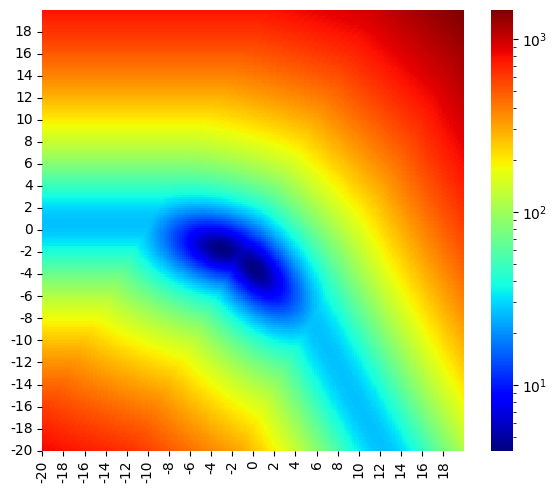

In [362]:
#Plotting objective for p=2 optimiser
fig, ax = plt.subplots(1,1, figsize=(6,5))
fig.tight_layout()

sns.heatmap(np.transpose(Objective[0:200,0:200]), cmap = 'jet', ax=ax, norm = LogNorm())
ax.axes.invert_yaxis()
ax.set_xticks(range(0,200,10))
ax.set_xticklabels(f'{c}' for c in np.arange(-20,20,2))
ax.set_yticks(range(0,200,10))
ax.set_yticklabels(f'{c}' for c in np.arange(-20,20,2))

plt.savefig('Figures/Visualisation_2.png')

In [10]:
X = torch.randn((10,5))
v = torch.topk(X,2).values
print(X)
print(torch.max(v[:,0] - v[:,1]))

tensor([[-0.3542, -0.1939,  0.6619, -0.9077,  0.7239],
        [ 1.0219,  1.1078, -0.4622,  0.2424, -0.0174],
        [-0.1595, -0.0030,  0.5098, -2.3797,  2.3831],
        [ 1.4980, -2.4058, -0.4698, -1.4108, -0.6836],
        [ 0.8918,  1.5210,  1.1229, -1.5826, -0.3797],
        [-1.3372,  0.5051,  0.2113,  0.1065,  2.6844],
        [ 0.9402, -1.6085,  0.2422, -0.6600, -0.0576],
        [-0.8023,  0.4770, -1.4529,  0.6415, -0.7277],
        [ 0.2785,  0.0512,  0.1555,  0.6908,  0.3974],
        [ 0.8922,  1.4093, -0.2349, -0.2421,  1.7323]])
tensor(2.1792)


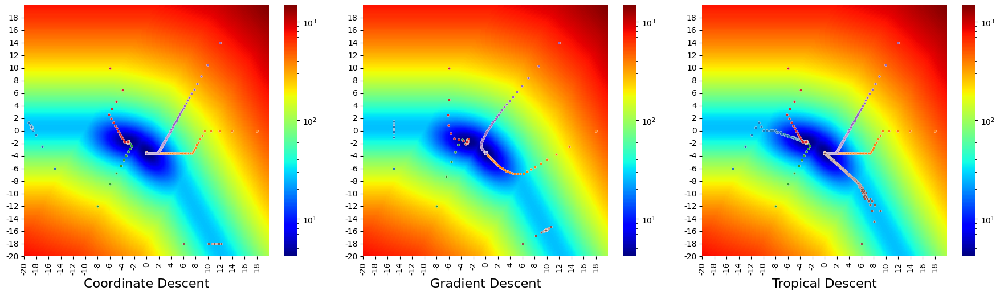

In [375]:
#Plotting steepest descent for p=2 optimiser
fig, ax = plt.subplots(1,3, figsize=(18,5))
fig.tight_layout()
axis_labels = ["Coordinate Descent", "Gradient Descent", "Tropical Descent"]

for i in range(3):

    sns.heatmap(np.transpose(Objective[0:200,0:200]), cmap = 'jet', ax=ax[i], norm = LogNorm())
    ax[i].axes.invert_yaxis()
    ax[i].set_xticks(range(0,200,10))
    ax[i].set_xticklabels(f'{c}' for c in np.arange(-20,20,2))
    ax[i].set_yticks(range(0,200,10))
    ax[i].set_yticklabels(f'{c}' for c in np.arange(-20,20,2))
    ax[i].set_xlabel(axis_labels[i], fontsize = 16)

for i in range(6):
    sns.scatterplot(x = (20+L1GD_Mat_Values[i][0,:])*5, y = (L1GD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[0])
    sns.scatterplot(x = (20+L2GD_Mat_Values[i][0,:])*5, y = (L2GD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[1])
    sns.scatterplot(x = (20+TGD_Mat_Values[i][0,:])*5, y = (TGD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[2])

plt.savefig('Figures/SD_Visualisation_2.png', bbox_inches = 'tight')

In [274]:
#Calculating p=inf objective
InfObjective = np.zeros([200,200])

for t1 in range(200):
    for t2 in range(200):

        InfObjective[t1,t2] = objective_function_infty(X,Y,supp, rev_proj(torch.tensor([[t1/5-20], [t2/5-20]],dtype = torch.double)))

In [275]:
#Running steepest descent for p=inf optimiser
Inf_L1GD_Mat_Values = []
Inf_L2GD_Mat_Values = []
Inf_TGD_Mat_Values = []


for i in range(num_exps):
    Inf_Mat_Init = torch.tensor(rev_proj(torch.tensor(np.random.rand(2)*2*init_scale-init_scale, dtype=torch.double)), requires_grad=True)

    Inf_L1GD_Mat = torch.tensor(Inf_Mat_Init,requires_grad=True)
    _,L1GD_Inf_loss_values,L1GD_Inf_Mat_values = infL1GD(X, Y, Inf_L1GD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    Inf_L1GD_Mat_Values.append(proj(torch.tensor(np.transpose(L1GD_Inf_Mat_values),dtype = torch.double)))
    
    Inf_L2GD_Mat = torch.tensor(Inf_Mat_Init,requires_grad=True)
    _,L2GD_Inf_loss_values,L2GD_Inf_Mat_values = infL2GD(X, Y, Inf_L2GD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    Inf_L2GD_Mat_Values.append(proj(torch.tensor(np.transpose(L2GD_Inf_Mat_values),dtype = torch.double)))
    
    Inf_TSD_Mat = torch.tensor(Inf_Mat_Init,requires_grad=True)
    _,TGD_Inf_loss_values,TGD_Inf_Mat_values = TSD(X, Y, Inf_TSD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    Inf_TGD_Mat_Values.append(proj(torch.tensor(np.transpose(TGD_Inf_Mat_values),dtype = torch.double)))

C:\Users\rst17\AppData\Local\Temp\ipykernel_25080\503424292.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Inf_Mat_Init = torch.tensor(rev_proj(torch.tensor(np.random.rand(2)*2*init_scale-init_scale, dtype=torch.double)), requires_grad=True)
C:\Users\rst17\AppData\Local\Temp\ipykernel_25080\503424292.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Inf_L1GD_Mat = torch.tensor(Inf_Mat_Init,requires_grad=True)
C:\Users\rst17\AppData\Local\Temp\ipykernel_25080\503424292.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  Inf_L2GD_M

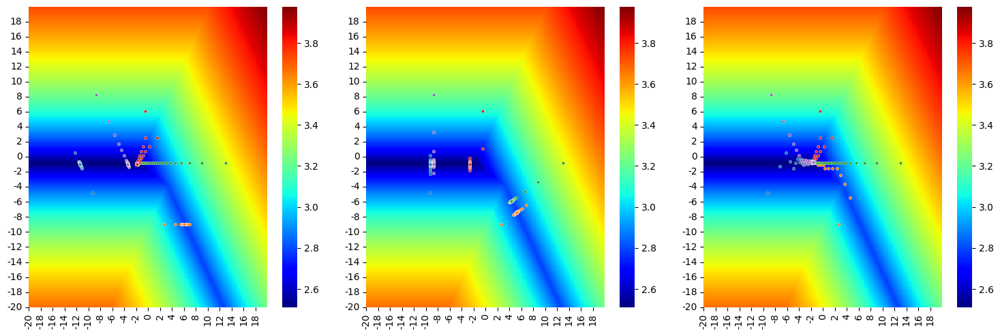

In [276]:
#Plotting steepest descent for p=inf optimiser
fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.tight_layout()

for i in range(3):

    sns.heatmap(np.transpose(np.log(InfObjective[0:200,0:200])), cmap = 'jet', ax=ax[i])
    ax[i].axes.invert_yaxis()
    ax[i].set_xticks(range(0,200,10))
    ax[i].set_xticklabels(f'{c}' for c in np.arange(-20,20,2))
    ax[i].set_yticks(range(0,200,10))
    ax[i].set_yticklabels(f'{c}' for c in np.arange(-20,20,2))

for i in range(5):
    sns.scatterplot(x = (20+Inf_L1GD_Mat_Values[i][0,:])*5, y = (Inf_L1GD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[0])
    sns.scatterplot(x = (20+Inf_L2GD_Mat_Values[i][0,:])*5, y = (Inf_L2GD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[1])
    sns.scatterplot(x = (20+Inf_TGD_Mat_Values[i][0,:])*5, y = (Inf_TGD_Mat_Values[i][1,:]+20)*5, s=10, ax = ax[2])

plt.savefig('Figures/SD_Visualisation_inf.png')

# Tropical Statistics

In [2]:
#Defining Steepest Descent function
def id(i, norm):
    return i + 1

def SD(loss_fn, t, lr, num_steps, tol_loss, tol_t, step_size = id, grad = "T2", termination = True, lam_Lagrange = False):
    N = len(t.data)
    #M = Y.size(dim=1)
    steps = num_iter

    loss_values = []
    t_values = []

    if grad in ["Adam", "TropAdam"]:
        optimizer = optim.Adamax([t], lr=lr)
    if grad in ["SGD", "TropSGD"]:
        opimizer = optim.SGD([Mat], lr=lr, momentum=momentum)
        

    # Perform gradient descent
    for i in range(num_steps):

        #loss and gradient computation
        if lam_Lagrange:
            loss = loss_fn(t[1:],t[0])
        else:
            loss = loss_fn(t)
        loss_values.append(loss.item())
        t_values.append(t.detach().clone().numpy())
        loss.backward()
        
        #step direction computation
        if not torch.nonzero(t.grad.data).numel():
            steps = i
            break
        elif grad in ["L1", "L2", "T1", "T2"]:
            if grad == "L1":
                step = torch.zeros(N)
                step[torch.argmax(torch.abs(t.grad.data))] = torch.sign(t.grad.data[torch.argmax(torch.abs(t.grad.data))])
                norm = torch.sum(torch.abs(t.grad.data))
            elif grad == "L2":
                step = (t.grad.data)/torch.linalg.norm(t.grad.data, ord = 2)
                norm = torch.linalg.norm(t.grad.data, ord = 2)
            elif grad == "T1":
                step = (t.grad.data > 0).float()
                norm = torch.max(t.grad.data) - torch.min(t.grad.data)
            elif grad == "T2":
                step = torch.zeros(N)
                step[torch.argmax(t.grad.data)] = 1
                norm = torch.max(t.grad.data)
            t.data = t.data - lr*step*step_size(i, norm)
        elif grad in ["Adam", "SGD"]:
            optimizer.step()
        elif grad in ["TropAdam", "TropSGD"]:
            t.grad.data = (t.grad.data > 0).float() * (torch.max(t.grad.data) - torch.min(t.grad.data))
            optimizer.step()
        t.grad.data.zero_()

        #convergence tests
        if i>5 and termination:
            # if (np.abs(loss_values[-1] - loss_values[-2]) < tol_loss) and (np.abs(loss_values[-2] - loss_values[-3]) < tol_loss):
            #     steps = i
                
            #     break
            if np.ptp(t_values[-1]-t_values[-10]) < 3*lr/num_iter:
                print("converged")
                steps = i
                break
            
    return steps, loss_values, t_values

In [3]:
#Calculating objective plot
def objective(loss_fn, resolution = 100, scale = 5, shift = 10, plot = False, logplot = False, save_plot = False, Stats_Prob = 'WDDD'):
    Objective = np.zeros([resolution,resolution])

    for t1 in range(resolution):
        for t2 in range(resolution):

            Objective[t1,t2] = loss_fn(rev_proj(torch.tensor([t1/scale-shift, t2/scale-shift],dtype = torch.double)))

    if plot:
        #Plotting steepest descent for p=2 optimiser
        fig, ax = plt.subplots(1,1, figsize=(6,5))
        fig.tight_layout()

        if logplot:
            sns.heatmap(np.transpose(np.log(Objective)), cmap = 'jet', ax=ax)
        else:
            sns.heatmap(np.transpose(Objective), cmap = 'jet', ax=ax)
        ax.axes.invert_yaxis()
        #sns.scatterplot(x=5*(proj(-np.transpose(X))[0]+20), y=5*(proj(-np.transpose(X))[1]+20))

        if save_plot:
            plt.savefig('Figures/%s_Visualisation_2.png' %Stats_Prob)
        
    return Objective

In [4]:
#Running steepest descent for p=2 optimiser
def run_SD(loss_fn, t_dim = 3, iter_count = 25, grad_types = ["L1", "L2", "T1", "T2"], termination = True):
    t_values = []
    loss_values = []
    steps = np.zeros((iter_count,len(grad_types)))

    for i in range(iter_count):
        t_init = torch.rand(t_dim, dtype=torch.double)*30 - 15
        i_loss_vals = [[]]*len(grad_types)
        i_t_vals = [[]]*len(grad_types)

        print(i)

        for grad_index, grad in enumerate(grad_types):
            GD_t = t_init.clone().detach().requires_grad_(True)
            steps[i,grad_index],i_loss_vals[grad_index],i_t_vals[grad_index] = SD(loss_fn, GD_t, lr, num_steps, tol_loss, tol_t, step_size=step_size, grad = grad, termination=termination)

        loss_values.append(i_loss_vals)
        t_values.append(i_t_vals)
        
    return loss_values, t_values, steps

In [5]:
#Plotting steepest descent for optimiser
def plot_SD(t_values, Objective, grad_types = ["L1", "L2", "T1", "T2"], logplot = False, save_plot = False):
    grad_count = len(grad_types)

    fig, ax = plt.subplots(1,grad_count, figsize=(5*grad_count,5))
    fig.tight_layout()

    for i in range(grad_count):

        if logplot:
            sns.heatmap(np.transpose(np.log(Objective[0:100,0:100])), cmap = 'jet', ax=ax[i])
        else:
            sns.heatmap(np.transpose(Objective[0:100,0:100]), cmap = 'jet', ax=ax[i])
        ax[i].axes.invert_yaxis()
        ax[i].set_xticks(range(0,100,10))
        ax[i].set_xticklabels(f'{c}' for c in np.arange(-10,10,2))
        ax[i].set_yticks(range(0,100,10))
        ax[i].set_yticklabels(f'{c}' for c in np.arange(-10,10,2))

    for i in range(5):
        for j in range(grad_count):
            t_Values = proj(torch.tensor(np.transpose(t_values[i][j]),dtype = torch.double))
            sns.scatterplot(x = (10+t_Values[0,:])*5, y = (t_Values[1,:]+10)*5, s=10, ax = ax[j])

    if save_plot:
        plt.savefig('Figures/%s_Visualisation_2.png' %Stats_Prob)

In [6]:
#Fill data
def fill_data(data, length = 200):
    for i in range(len(data)):
        for j in range(len(data[i])):
            data[i][j] += [data[i][j][-1]]*(length - len(data[i][j]))

In [7]:
#Plotting histogram of converged value
def loss_hist_plot(loss_values, grad_types, min = 0, iter_list = [10, 20, 50, 100, 200], save_plot = False):
    grad_count = len(grad_types)

    fig, axs = plt.subplots(grad_count,len(iter_list), figsize = (5*len(iter_list),5*grad_count))
    fig.tight_layout()
    ax = fig.add_subplot(111,frameon=False)
    plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
    plt.grid(False)
    plt.xlabel("Loss value",fontsize = 35)

    axislims = np.max(np.max(loss_values, axis = 0), axis = 0)
    bin_width = (axislims - min)/50

    for i in range(len(iter_list)):
            axs[0,i].set_title(f"After {iter_list[i]} steps",fontsize = 30)
            for j in range(grad_count):
                    axs[j,i].hist(loss_values[:,j,iter_list[i]-1], bins = list(np.arange(min,axislims[iter_list[i]-1]+1,bin_width[iter_list[i]-1])))
                    axs[j,i].set_xlim([min,axislims[iter_list[i]-1]])
                    axs[j,i].set_ylim([0,50])
                    axs[j,i].tick_params(axis='x', labelsize=18)
                    axs[j,i].tick_params(axis='y', labelsize=18)

    for j, grad_type in enumerate(grad_types):
        axs[j,0].set_ylabel((grad_type+" Descent Freq"),fontsize = 25)

    fig.tight_layout()

    #axs[len(iter_list)-1].legend(prop={'size':20})

    plt.savefig('Figures/SD_Loss_Histogram_2.png')

In [8]:
#Logplot of error for successful iterations
def log_error_plot(loss_values, grad_types, global_solution, successes = None):
    
    log_loss_values = np.log(np.array(loss_values - global_solution*0.995))
    if successes is None:
        mean_log_loss_values = np.mean(log_loss_values,axis = 0)
        std_log_loss_values = np.std(log_loss_values,axis = 0)
    else:
        mean_log_loss_values = np.mean(log_loss_values,axis = 0, where=np.repeat(successes[:,:,np.newaxis], num_iter, axis = 2))
        std_log_loss_values = np.std(log_loss_values,axis = 0, where=np.repeat(successes[:,:,np.newaxis], num_iter, axis = 2))

    plt.figure()

    for j, grad_type in enumerate(grad_types):
        plt.errorbar(range(len(log_loss_values[0,0,20:])), mean_log_loss_values[j,20:]
                     #,std_log_loss_values[j,70:]
                     )

    plt.legend(grad_types)

    plt.show()


In [9]:
#Run experiments

def run_experiments(loss_fn, t_dim, Stats_Prob, grad_types = ["L1", "L2", "T1", "T2"], objective_vis = True, print_steps = True, plot_SD_vis = True, plot_loss_hist = True, plot_log_error = True):

    if t_dim == 3 and objective_vis:
        Objective = objective(loss_fn, plot = True, Stats_Prob='Stats_Prob')

    #Running steepest descent for p=2 optimiser
    loss_values, t_values, steps = run_SD(loss_fn, t_dim=t_dim, iter_count = num_exps, grad_types=grad_types, termination=False)

    print("SD ran")

    if print_steps:
        print("mean steps: ", np.mean(steps,axis=0))
        print("std steps: ", np.std(steps,axis=0))
        fill_data(loss_values, num_iter)
        global_solution = np.min(loss_values)
        successes = np.array(loss_values)[:,:,-1] < global_solution + 5*tol_loss
        convergence = np.array(steps)[:,:] < num_steps - 5
        print("convergence count: ", np.sum(convergence,axis=0))
        print("success count: ", np.sum(successes,axis=0))

    #Plotting steepest descent for p=2 optimiser
    if t_dim == 3 and plot_SD_vis:
        plot_SD(t_values, Objective, grad_types=grad_types)

    if plot_loss_hist:
        loss_hist_plot(np.array(loss_values), grad_types=grad_types, min = global_solution - 5*tol_loss)

    if plot_log_error:
        log_error_plot(loss_values, grad_types, global_solution)

    return loss_values, t_values

## Fermat Weber Means
Look to be finding global minimum in every case. Classic gradient descent seems fastest though

In [13]:
#Setting hyperparameters, generating and plotting data

Stats_Prob = "FW"
num_exps = 5 # number of experiments
n = 20 # number of data
N = 8 # input dimension
lr = 5
num_steps = 200
tol_loss = 1e-3
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return 1/(i+1)

#X = torch.tensor(np.load("C:/Users/rst17/OneDrive - Imperial College London/TropicalGD/T.npy"), dtype = torch.double)*40
X = torch.tensor(np.random.rand(n,N), dtype = torch.double)*10
Y = torch.tensor(np.zeros((n,N)))
supp = [{i} for i in range(N)]

def loss_fn(t):
    return torch.sum(trop_dist(X,t))

In [14]:
# Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "FW", grad_types = ["L2", "T1", "Adam", "TropAdam"])

0


NameError: name 'num_iter' is not defined

## Frechet Means

In [102]:
#Setting hyperparameters, generating and plotting data
Stats_Prob = "FM"
num_exps = 15 # number of experiments
n = 10 # number of data
N = 8 # input dimension
lr = 10
num_iter = 200
tol_loss = 1e-3
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return 1/(i + 1)

X = torch.tensor(np.random.rand(n,N), dtype = torch.double)*10
Y = torch.tensor(np.zeros((n,N)))
supp = [{i} for i in range(N)]

def loss_fn(t):
    return torch.sum(trop_dist(X,t)**2)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
SD ran
mean steps:  [200. 200. 200. 200.]
std steps:  [0. 0. 0. 0.]
convergence count:  [0 0 0 0]
success count:  [0 0 0 0]


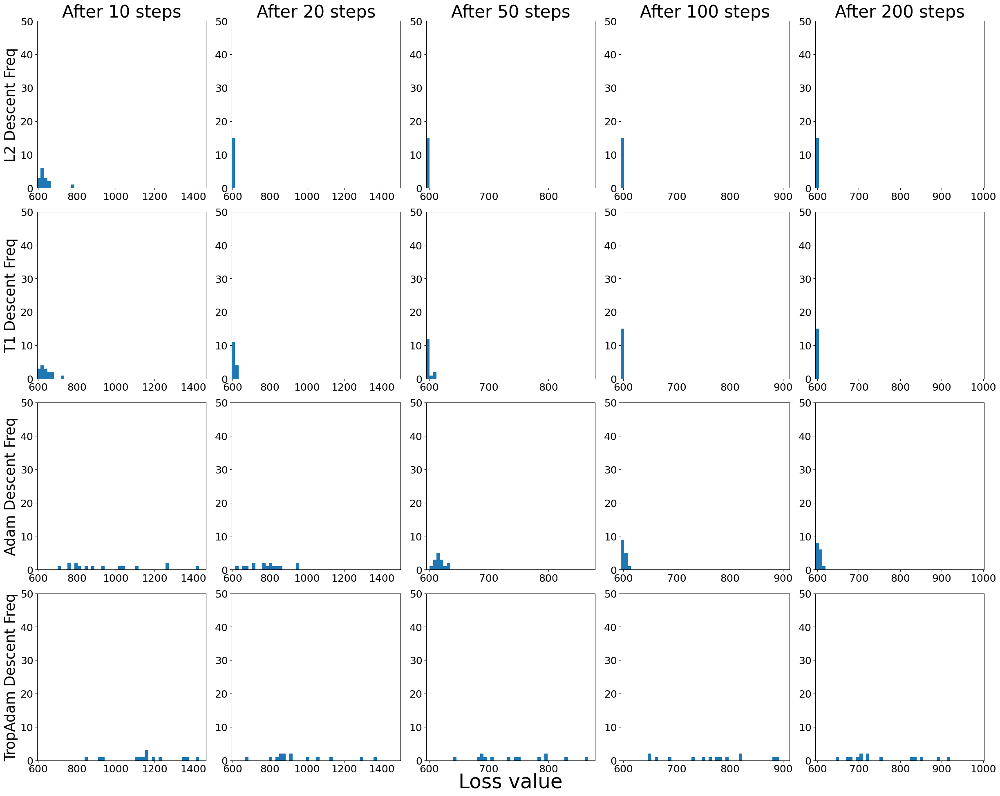

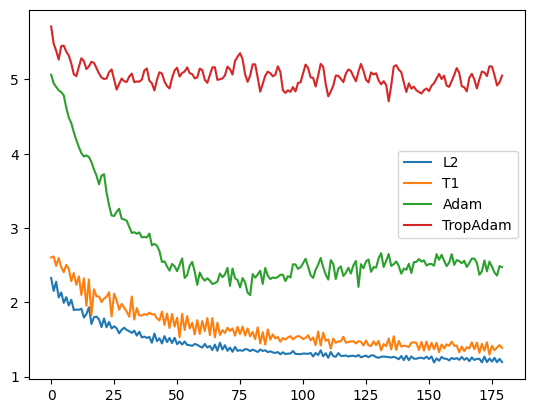

In [103]:
# Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "FM", grad_types = ["L2", "T1", "Adam", "TropAdam"])

## WDDD2

In [104]:
#Setting hyperparameters, generating and plotting data
Stats_Prob = "WDDD2"
num_exps = 15 # number of experiments
n = 10 # number of data
N = 8 # input dimension
M = 5
lr = 10
num_iter = 200
tol_loss = 1e-3
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return 1/(i + 1)

supp = rand_supp(N, M)
X = torch.randn(n, N)*10
Y = IdProj(X, supp)

def loss_fn(t):
    return objective_function(X,Y,supp, t, p = 2)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
SD ran
mean steps:  [200. 200. 200. 200.]
std steps:  [0. 0. 0. 0.]
convergence count:  [0 0 0 0]
success count:  [11 12  8  0]


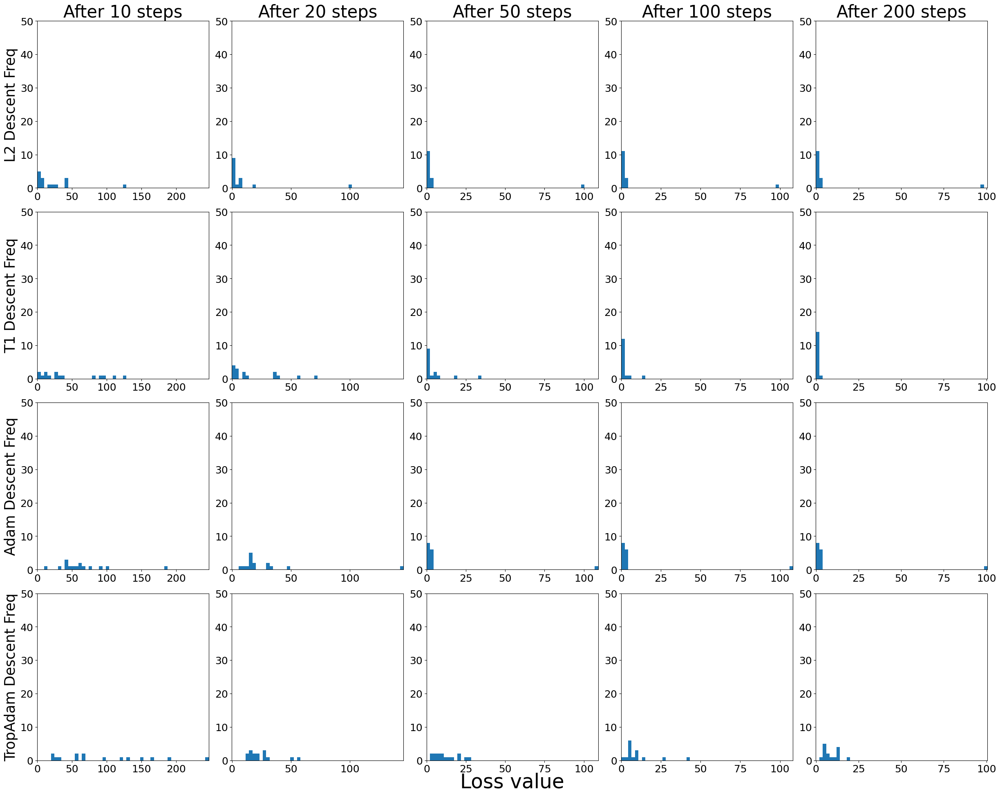

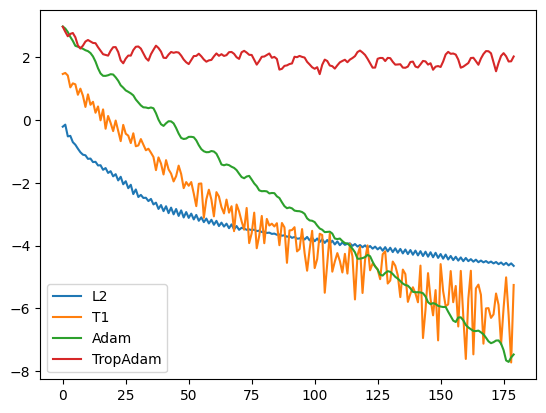

In [105]:
#Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "WDDD2", grad_types = ["L2", "T1", "Adam", "TropAdam"])

## WDDDinf

In [106]:
#Setting hyperparameters, generating and plotting data
Stats_Prob = "WDDDinf"
num_exps = 15 # number of experiments
n = 30 # number of data
N = 10 # input dimension
M = 5
beta = (0.05,0.1)
lr = 10
num_steps = 150
tol_loss = 1e-3
tol_t = 1e-5
t_dim = N
def step_size(i, norm):
    return np.sqrt(i + 1)

supp = rand_supp(N, M)
X = torch.randn(n, N)*10
Y = IdProj(X, supp)

def loss_fn(t):
    return objective_function_infty(X,Y,supp, t)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
SD ran
mean steps:  [200. 200. 200. 200.]
std steps:  [0. 0. 0. 0.]
convergence count:  [0 0 0 0]
success count:  [0 0 0 0]


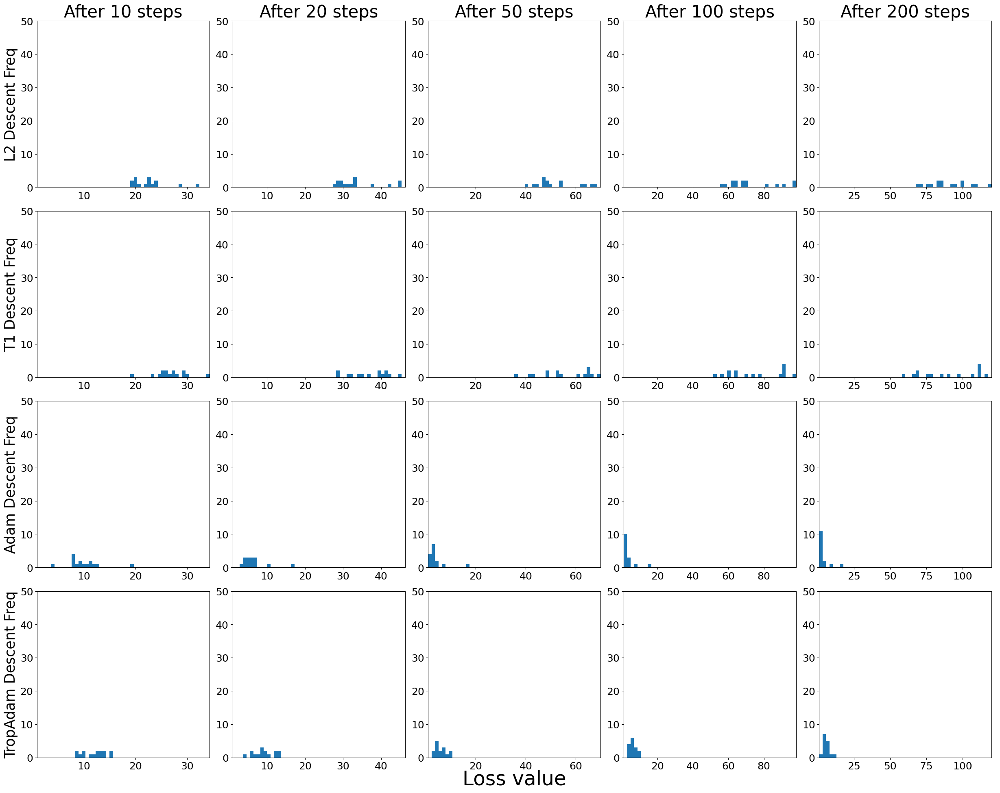

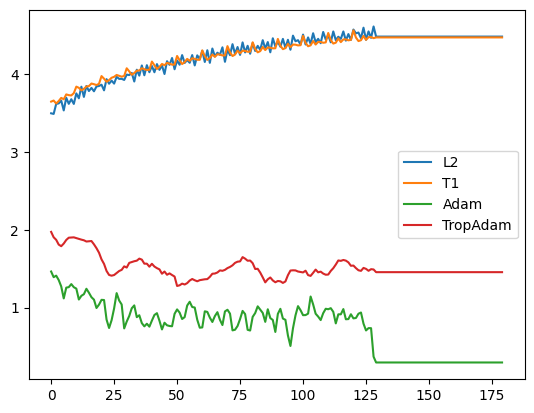

In [107]:
#Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "WDDDinf", grad_types = ["L2", "T1", "Adam", "TropAdam"])

## Tropical Polytope PCA
Results sort of reasonable, but no valleys seen (valleys are expected). Stuck in several constant regions.

In [19]:
#Setting hyperparameters, generating and plotting data
Stats_Prob = "PCA"
num_exps = 15 # number of experiments
n = 10 # number of data
N = 8 # input dimension
lr = 10
num_iter = 300
tol_loss = 1e-3
tol_mat = 1e-5
t_dim = 3*N
def step_size(i, norm):
    return i // 3 + 1

X = torch.tensor(np.random.rand(n,N)*10, dtype = torch.double)
D2 = torch.tensor([-4,0,3.5])
D3 = torch.tensor([-4,6,-2])

def PCA_objective(D1, D2, D3, X):

    D1 = torch.flatten(D1)

    n = len(X)
    d = len(D1)

    l = torch.empty([3,n])

    l[0,:] = torch.min(X-D1, dim = 1).values
    l[1,:] = torch.min(X-D2, dim = 1).values
    l[2,:] = torch.min(X-D3, dim = 1).values

    sum = 0

    for k in range(n):

        proj_u = torch.maximum(l[0,k] + D1, torch.maximum(l[1,k] + D2, l[2,k] + D3))

        sum += trop_dist(proj_u, X[k])

    return sum

def loss_fn(t):
    return PCA_objective(t[:N], t[N:2*N],t[2*N:], X)

Objective Calculated
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
SD ran
mean steps:  [170.66666667 212.93333333 300.         300.        ]
std steps:  [113.11803079 109.64577309   0.           0.        ]
success count:  [0 0 0 0]


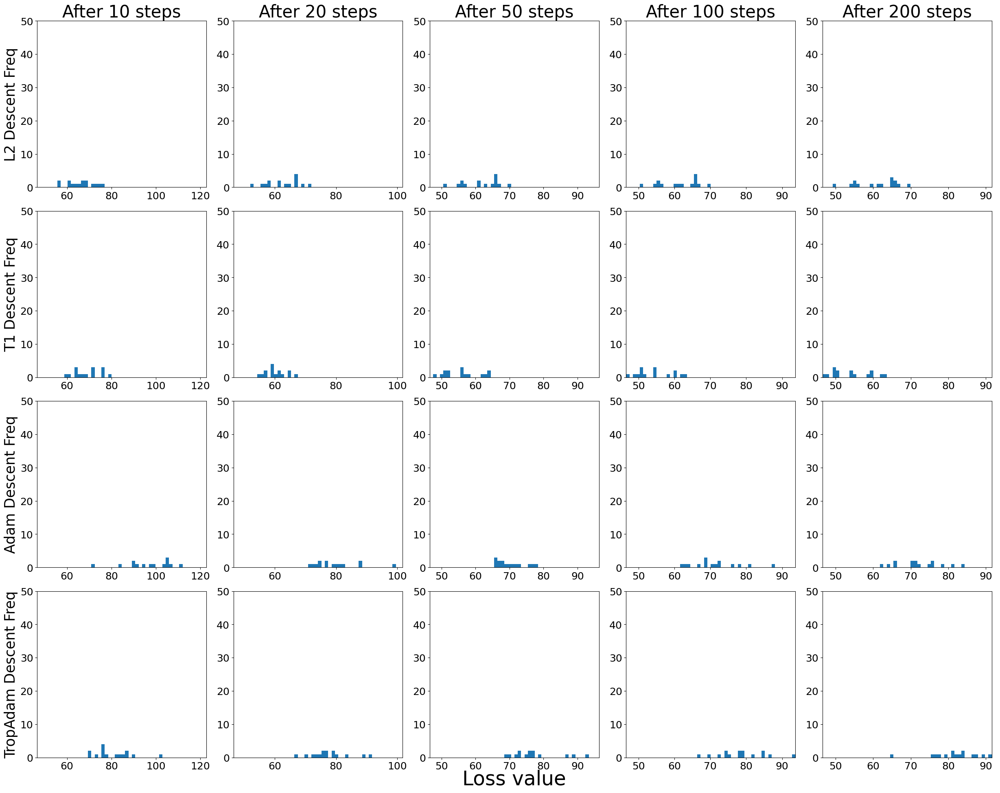

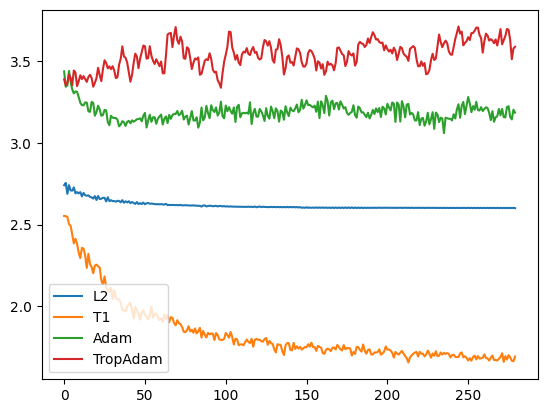

([[[113.25926618927383,
    71.48812651166028,
    88.33740047991884,
    69.6488945127843,
    64.2458029590692,
    69.39264944469842,
    64.21320520273281,
    56.59516478792362,
    58.66936882929126,
    56.34629558237726,
    52.99253882879243,
    57.420534072185674,
    55.9478381737373,
    53.71444662039737,
    55.82089705559393,
    53.767455347467816,
    54.06255298336905,
    53.637087389222536,
    53.674215777532616,
    52.56609715581209,
    53.809404836486685,
    52.808875311963824,
    51.3995064420053,
    52.466622701882045,
    51.61141509144395,
    51.43420195598479,
    53.92255736331269,
    51.016456451172665,
    52.5918221189314,
    51.569896293807005,
    52.498909518509976,
    51.30060747003664,
    52.082750643576716,
    51.66508128067431,
    51.496907714005765,
    51.597254633083985,
    51.45828530111383,
    51.232546764359995,
    51.40619998133601,
    51.563832845488726,
    51.06840499703349,
    51.338398140904765,
    51.41175094734057,

In [20]:
#Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "PCA", grad_types = ["L2", "T1", "Adam", "TropAdam"])

## Tropical Logistic Regression

In [54]:
#Setting hyperparameters, generating and plotting data

num_exps = 15 # number of experiments
n = 10 # number of data
N = 8 # input dimension
lr = 10
num_iter = 200
tol_loss = 1e-3
tol_mat = 1e-5
t_dim = 2*N
def step_size(i, norm):
    return i // 2 + 1

X = torch.tensor(np.concatenate((np.random.multivariate_normal(np.random.rand(N)*10,np.identity(N)*3, n), np.random.multivariate_normal(np.random.rand(N)*10,np.identity(N)*3, n))), dtype = torch.double)
Y = torch.tensor([1]*n + [0]*n, dtype = torch.double)
l0 = torch.tensor([1]).float()
l1 = torch.tensor([1]).float()
w1 = torch.tensor(np.random.rand(N)*10)

def LogR_objective(X, Y, w0, l0, w1, l1):

    n = len(X)
    d = len(w0)

    h = torch.empty([n])
    f = torch.empty([n])

    for k in range(n):

        h[k] = l0*trop_dist(X[k],w0)- l1*trop_dist(X[k],w1)+ (d-1)*torch.log(l1/l0)

        f[k] = Y[k]*torch.log(1/(1+torch.exp(-h[k])))+ (1-Y[k])*torch.log(1/(1+torch.exp(h[k])))

    return torch.sum(f)

def loss_fn(t):

    return -LogR_objective(X,Y,t[:N],l0,t[N:],l1)

Objective Calculated
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
SD ran
mean steps:  [200. 200. 200. 200.]
std steps:  [0. 0. 0. 0.]
success count:  [ 3 11  1  0]


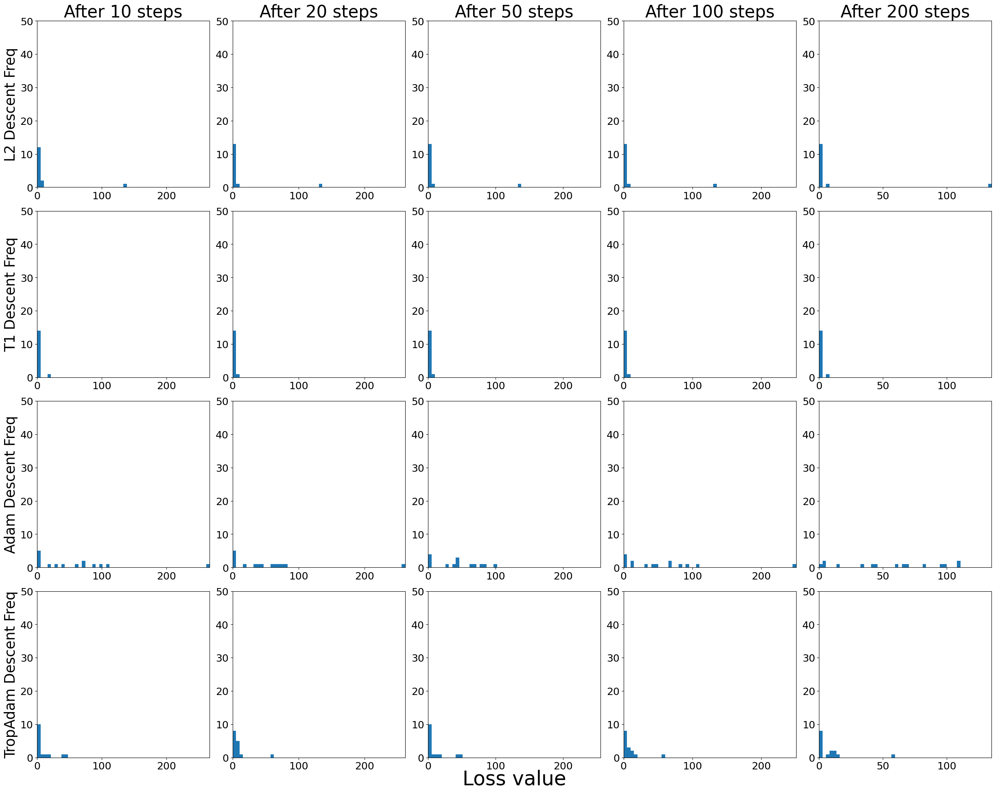

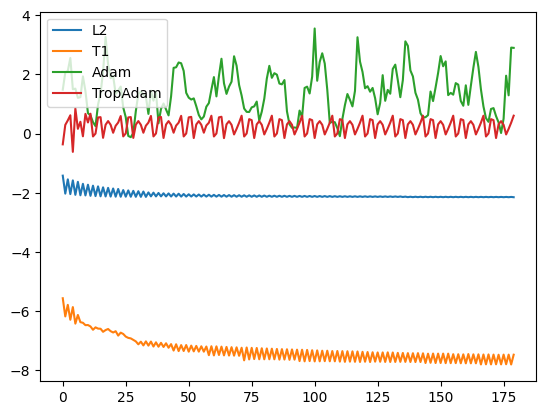

In [33]:
# Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "LogR", grad_types = ["L2", "T1", "Adam", "TropAdam"])

## Tropical Linear Regression
Tropical descent is terminating fastest, but may be due to convergence criterion

In [23]:
#Setting hyperparameters, generating and plotting data

num_exps = 15 # number of experiments
n = 10 # number of data
N = 8 # input dimension
lr = 10
num_iter = 200
tol_loss = 1e-3
tol_mat = 1e-5
t_dim = N
def step_size(i, norm):
    return i + 1

X = torch.tensor(np.random.multivariate_normal(np.random.rand(N)*10,np.identity(N)*3, n), dtype = torch.double)
Y = X[:,-1].clone().detach()

def LR_objective(beta, X, Y):

    n = len(X)
    
    return torch.sum((torch.max(beta
                                 #+ torch.concat((X, torch.zeros(n,1)),1)
                                 + X,
                                 dim = 1).values - Y)**2)

def loss_fn(t):
    return LR_objective(torch.flatten(t), X, Y)

Objective Calculated
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
SD ran
mean steps:  [200. 200. 200. 200.]
std steps:  [0. 0. 0. 0.]
success count:  [4 0 3 0]


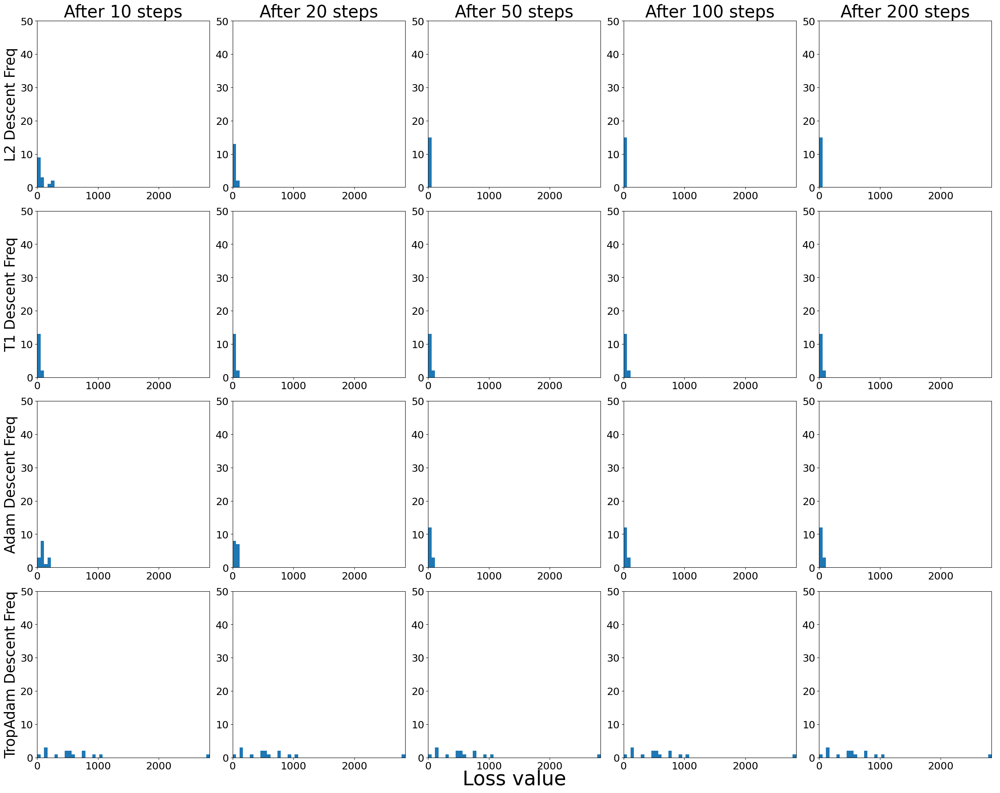

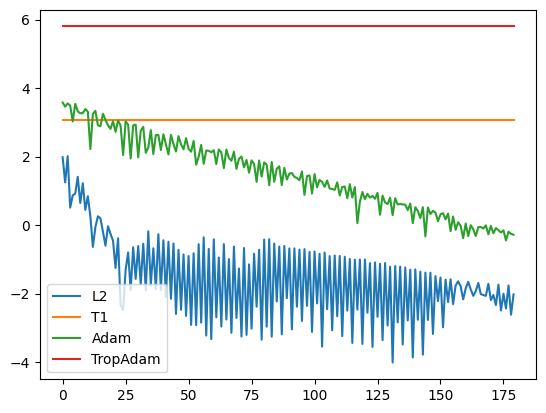

([[[4105.498968973036,
    1988.7662750895142,
    1128.8021257893142,
    848.5375625672925,
    689.6511887668573,
    540.9865611926024,
    439.12299530660005,
    363.268375622281,
    303.83095117789327,
    257.20804105942324,
    220.00171569233277,
    190.43682580161743,
    164.6133115245414,
    143.0475685830703,
    124.53619502874807,
    108.55001662887426,
    94.77376205999776,
    82.83701799281087,
    72.53951643957711,
    63.52342633730947,
    55.60974522326168,
    48.62219358975184,
    42.42578443382079,
    36.91506989077525,
    32.005830720220985,
    27.62932092869387,
    23.72830991355172,
    20.25434763072846,
    17.16584802065561,
    14.426717817681421,
    12.005351164407491,
    9.873873037116187,
    8.007555259724946,
    6.384355068549527,
    4.984542937016455,
    3.790397111695099,
    2.785949258614348,
    1.956770168283616,
    1.2897874943730874,
    0.7731295522443454,
    0.3959906230560862,
    0.1485142138492661,
    0.0216914517947

In [24]:
# Calculating p=2 objective
_,_ = run_experiments(loss_fn, t_dim, "LR", grad_types = ["L2", "T1", "Adam", "TropAdam"])

## Tropical Legrange Multipliers
Need to enable gradient ascent in t[0]

In [74]:
#Setting hyperparameters, generating and plotting data
def LM_init():
    num_exps = 15 # number of experiments
    n = 10 # number of data
    N = 2 # input dimension
    M = 2 # ouput dimension
    lr = 10
    num_iter = 200
    tol_loss = 1e-3
    tol_mat = 1e-5
    data_scale = 8
    init_scale = 20
    No_grad_types = 3
    p = 2
    labels = ['L1', 'L2', 'TR']
    t_dim = N + 1

    h = torch.zeros(2)

def Legrange_objective(t, lam, h):

    v = torch.topk(t - h,2).values

    return torch.multiply(lam,v[0]-v[1])

def loss_fn(t, lam):

    t = torch.flatten(t)
    return trop_dist(t, torch.zeros(t_dim -1)) - Legrange_objective(t,lam,h)

interesting
mean steps:  [200. 200. 200. 200.]
std steps:  [0. 0. 0. 0.]
success count:  [0 1 0 0]


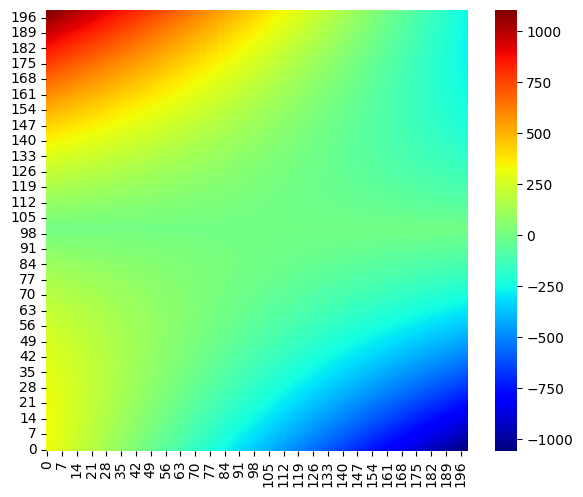

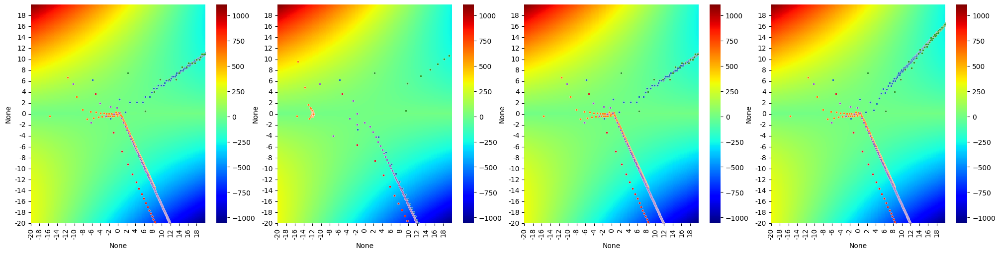

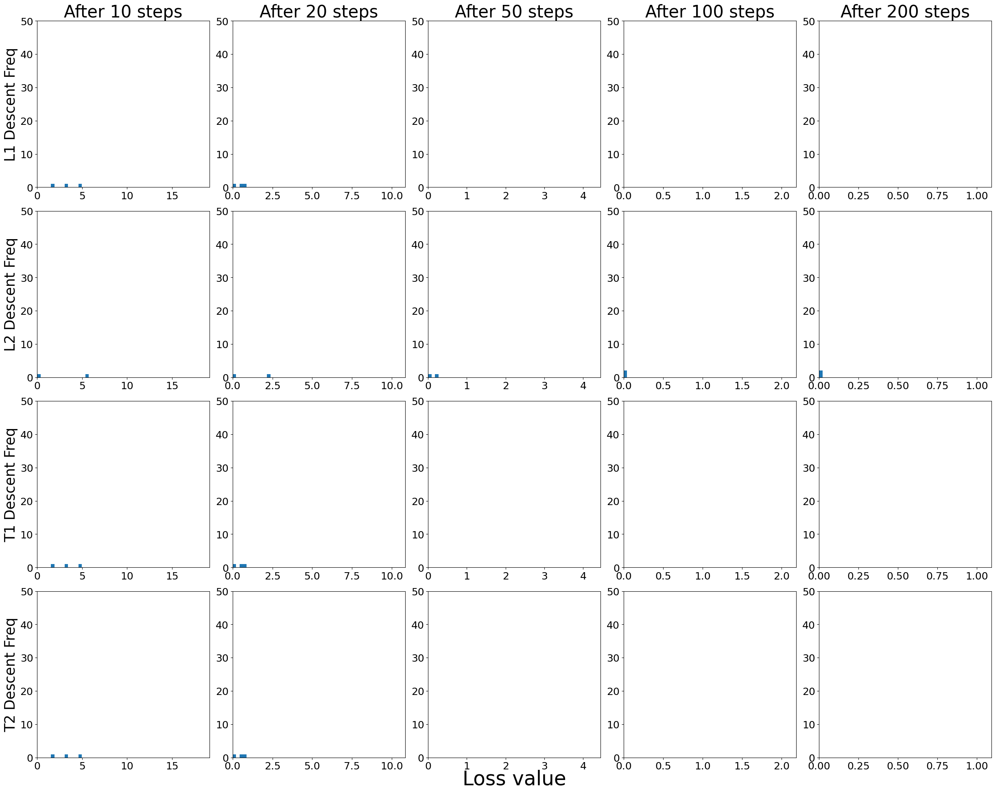

In [54]:
# Calculating p=2 objective
run_experiments(loss_fn, t_dim, plot_log_error = False)

## Tropical SVMs
Objective function does not seem continuous, SD not worked

In [55]:
#Setting hyperparameters, generating and plotting data

num_exps = 15 # number of experiments
n = 10 # number of data
N = 3 # input dimension
M = 2 # ouput dimension
lr = 5
num_iter = 200
tol_loss = 1e-3
tol_mat = 1e-5
data_scale = 8
init_scale = 20
No_grad_types = 3
p = 2
labels = ['L1', 'L2', 'TR']

X = torch.tensor([[0,0,0],[0,3,1],[0,2,5], [0, -1, 3]], dtype = torch.double)*3
Y = torch.tensor([[1,1,1],[1,0,1],[1,0,0], [1, 1, 0]], dtype = torch.double)

def SVM_objective(t, X, Y, C = 1):

    t = torch.flatten(torch.t(t))

    d = len(t)
    n = len(X)

    partialsum = torch.empty([n,d])

    values = torch.empty([n,d,d])

    for k in range(n):
        torch.max(X[k]+t) - X[k] + t
        partialsum[k] = torch.where(X[k]+t < torch.max(X[k]+t), Y[k], Y[k]-1)

    error = C*torch.sum(torch.min(partialsum, dim = 1).values)/n

    for k,x in enumerate(X):

        for i in [torch.argmax(t+x).tolist()]:

            for j in [torch.argmax(torch.cat(((t+x)[:i],(t+x)[i+1:])))]:

                if not j < i:
                    j += 1
                values[k,i,j] = (x+t)[i]-(x+t)[j]

    return torch.sum(partialsum)#error# + torch.min(values)

def loss_fn(t):
    return SVM_objective(t,X,Y,C=1)

interesting


RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

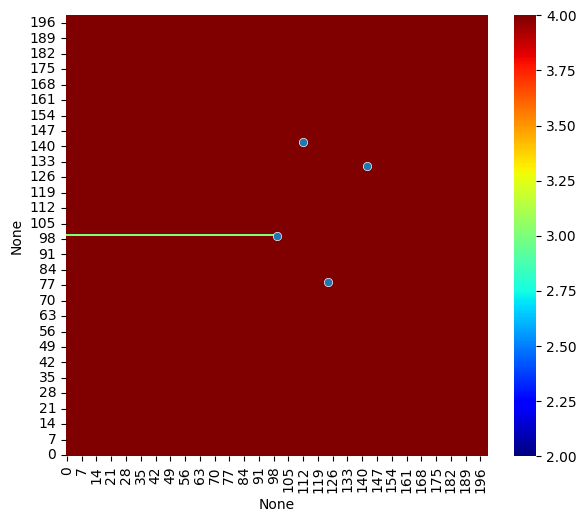

In [56]:
# Calculating p=2 objective
Objective = objective(loss_fn, plot = True)

grad_types = ["L1", "L2", "T1", "T2"]

#Running steepest descent for p=2 optimiser
_, t_values, steps = run_SD(loss_fn, grad_types=grad_types)

print(np.mean(steps,axis=0))
print(np.std(steps,axis=0))
print(np.sum(steps == num_iter,axis=0))

#Plotting steepest descent for p=2 optimiser
plot_SD(t_values, grad_types=grad_types)

## Tropical LDA

Code not written.

In [ ]:
#Setting hyperparameters, generating and plotting data

num_exps = 15 # number of experiments
n = 10 # number of data
N = 3 # input dimension
M = 2 # ouput dimension
lr = 5
num_iter = 200
tol_loss = 1e-3
tol_mat = 1e-5
data_scale = 8
init_scale = 20
No_grad_types = 3
p = 2
labels = ['L1', 'L2', 'TR']

X = torch.tensor([[0,0,0],[0,3,1],[0,2,5], [0, -1, 3]], dtype = torch.double)*3
Y = torch.tensor([[1,1,1],[1,0,1],[1,0,0], [1, 1, 0]], dtype = torch.double)
supp = [{0},{1},{2}]

# X = torch.randn(5, 3)*data_scale
# Y = torch.randn(5, 2)*data_scale

plt.scatter(proj(np.transpose(X))[0], proj(np.transpose(X))[1])

In [ ]:
def LDA_objective(X,Y):

    n = len(X)
    d = len(D1)

    lX = torch.empty([3,n])
    lY = torch.empty([3,n])

    lX[0,:] = torch.min(X-D1, dim = 1).values
    lX[1,:] = torch.min(X-D2, dim = 1).values
    lX[2,:] = torch.min(X-D3, dim = 1).values

    lY[0,:] = torch.min(Y-D1, dim = 1).values
    lY[1,:] = torch.min(Y-D2, dim = 1).values
    lY[2,:] = torch.min(Y-D3, dim = 1).values

    sum = 0

    for k in range(n):

        proj_uX = torch.minimum(lX[0,k] + D1, torch.minimum(lX[1,k] + D2, lX[2,k] + D3))

        #sum += trop_dist(proj_u, X[k])


D1 = torch.tensor([0,10,0])
D2 = torch.tensor([0,0,10])
D3 = torch.tensor([10,0,0])

LDA_objective(D1, D2, D3, X)

# Steepest Descent Experiments

In [46]:
#Setting hyperparameters

num_exps = 50 # number of experiments
n = 10 # number of data
N = 5 # input dimension
M = 3 # ouput dimension
lr = 5
num_iter = 200
tol_loss = 1e-3
tol_mat = 5e-2
iter_list = [10,20,50,100,200] 
data_scale = 5
init_scale = 20
No_grad_types = 3
p = 2
labels = ['L1', 'L2', 'TR']

In [47]:
#Run optimisation on arbitrary data with random initialisation

#Generate random test data
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = IdProj(X, supp)

SDsteps = np.zeros((num_exps,No_grad_types))
SDLosses = np.zeros((num_exps,No_grad_types,num_iter))

for i in range(num_exps):
    # Initialize variables
    Mat_Init = np.random.rand(N)*init_scale

    L1GD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    SDsteps[i,0],L1GD_loss_values,_ = L1GD(X, Y, supp, L1GD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    SDLosses[i,0,:] = L1GD_loss_values+([L1GD_loss_values[-1]] * int(num_iter - 1 - SDsteps[i,0])) 
    
    L2GD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    SDsteps[i,1],L2GD_loss_values,_ = L2GD(X, Y, supp, L2GD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    SDLosses[i,1,:] = L2GD_loss_values+([L2GD_loss_values[-1]] * int(num_iter - 1 - SDsteps[i,1])) 
    
    TSD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    SDsteps[i,2],TSD_loss_values,_ = TSD(X, Y, supp, TSD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    SDLosses[i,2,:] = TSD_loss_values+([TSD_loss_values[-1]] * int(num_iter - 1 - SDsteps[i,2])) 

In [48]:
#Computing average run time
print(np.mean(SDsteps,axis=0))
print(np.std(SDsteps,axis=0))

[146.34  94.82  44.34]
[63.86473518 73.94016229 20.19763352]


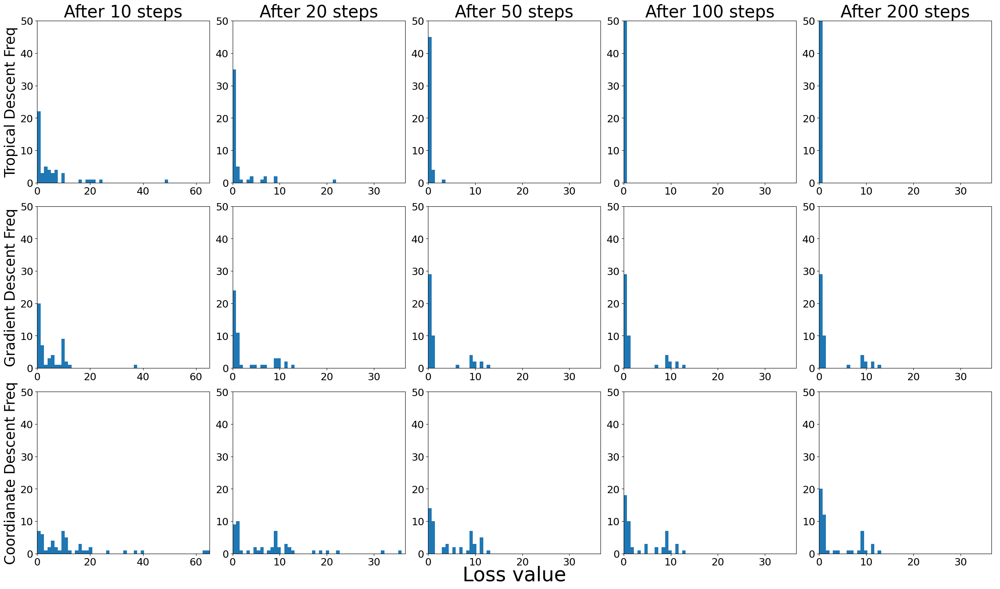

In [51]:
#Plotting histogram of converged value
fig, axs = plt.subplots(3,len(iter_list), figsize = (5*len(iter_list),5*3))
fig.tight_layout()
ax = fig.add_subplot(111,frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
plt.xlabel("Loss value",fontsize = 35)

axislims = np.max(np.max(SDLosses, axis = 0), axis = 0)
bin_width = axislims/50

for i in range(len(iter_list)):
        axs[0,i].set_title(f"After {iter_list[i]} steps",fontsize = 30)
        for j in range(3):
                axs[2-j,i].hist(SDLosses[:,j,iter_list[i]-1], bins = list(np.arange(0,axislims[iter_list[i]-1]+1,bin_width[iter_list[i]-1])))
                axs[2-j,i].set_xlim([0,axislims[iter_list[i]-1]])
                axs[2-j,i].set_ylim([0,50])
                axs[2-j,i].tick_params(axis='x', labelsize=18)
                axs[2-j,i].tick_params(axis='y', labelsize=18)

axs[2,0].set_ylabel(f"Coordianate Descent Freq",fontsize = 25)
axs[1,0].set_ylabel(f"Gradient Descent Freq",fontsize = 25)
axs[0,0].set_ylabel(f"Tropical Descent Freq",fontsize = 25)

fig.tight_layout()

#axs[len(iter_list)-1].legend(prop={'size':20})

plt.savefig('Figures/SD_Loss_Histogram_2.png')

# Adam Convergence for $p=2$

Compare the average steps of three optimizers. To do this, we fix the elements of the underlying tropical matrix to be 0 of given support. 

If either:
- the loss is less than predefined tolerance
- the difference between trained matrix and true matrix is less than the predefined tolerance

we regard as convergence.  

In [249]:
#Defining optimisation functions

# Adam optimizer
def AdamOP(X, Y, Mat, lr, betas, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    optimizer = optim.Adam([Mat], lr=lr, betas = betas)

    Adam_loss_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        Adam_loss_values.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if (i>5) and (np.abs(Adam_loss_values[-1] - Adam_loss_values[-2]) < tol_loss) and (np.abs(Adam_loss_values[-2] - Adam_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, Adam_loss_values
    else:
        return step, loss.item()

# SGD optimizer
def SGDOP(X, Y, Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    optimizer = optim.SGD([Mat], lr=lr, momentum=momentum)

    SGD_loss_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        SGD_loss_values.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if (i>5) and (np.abs(SGD_loss_values[-1] - SGD_loss_values[-2]) < tol_loss) and (np.abs(SGD_loss_values[-2] - SGD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, SGD_loss_values
    else:
        return step, loss.item()

# RMSprop optimizer
def RMSpropOP(X, Y, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    optimizer = optim.RMSprop([Mat], lr=lr)

    RMSprop_loss_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        RMSprop_loss_values.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if (i>5) and (np.abs(RMSprop_loss_values[-1] - RMSprop_loss_values[-2]) < tol_loss) and (np.abs(RMSprop_loss_values[-2] - RMSprop_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, RMSprop_loss_values
    else:
        return step, loss.item()

# TGD optimizer
def TGDOP(X, Y, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    TGD_loss_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        TGD_loss_values.append(loss.item())
        loss.backward()
        Mat.data = Mat.data - lr * (Mat.grad.data > 0).float() * (max(Mat.grad.data) - min(Mat.grad.data))
        Mat.grad.data.zero_()
        if (i>5) and (np.abs(TGD_loss_values[-1] - TGD_loss_values[-2]) < tol_loss) and (np.abs(TGD_loss_values[-2] - TGD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, TGD_loss_values
    else:
        return step, loss.item()
    
# Adam optimizer
def TropAdamOP(X, Y, Mat, lr, betas, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    optimizer = optim.Adam([Mat], lr=lr, betas=betas)

    TropAdam_loss_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        TropAdam_loss_values.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        Mat.grad.data = (Mat.grad.data > 0).float() * (max(Mat.grad.data) - min(Mat.grad.data))
        optimizer.step()
        if (i>5) and (np.abs(TropAdam_loss_values[-1] - TropAdam_loss_values[-2]) < tol_loss) and (np.abs(TropAdam_loss_values[-2] - TropAdam_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, TropAdam_loss_values
    else:
        return step, loss.item()
    
# SGD optimizer
def STGDOP(X, Y, Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    optimizer = optim.SGD([Mat], lr=lr, momentum=momentum)

    STGD_loss_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function(X, Y, supp, Mat, 2)
        STGD_loss_values.append(loss.item())
        optimizer.zero_grad()
        #batch_loss = objective_function(X_subsample, Y_subsample, supp, Mat, 2)
        #loss.backward()
        #Mat.grad.data = tropicalised
        #optimiser.step()
        loss.backward()
        Mat.grad.data = (Mat.grad.data > 0).float() * (max(Mat.grad.data) - min(Mat.grad.data))
        optimizer.step()
        if (i>5) and (np.abs(STGD_loss_values[-1] - STGD_loss_values[-2]) < tol_loss) and (np.abs(STGD_loss_values[-2] - STGD_loss_values[-3]) < tol_loss):
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, STGD_loss_values
    else:
        return step, loss.item()

In [299]:
#Setting hyperparameters

num_exps = 50 # number of experiments
n = 10 # number of data
N = 5 # input dimension
M = 3 # output dimension
lr = 0.5
num_iter = 300
momentum = 0 #default is 0, range [0,1]
tol_loss = 1e-2
tol_mat = 5e-2
iter_list = [10,20,50,100,200,300] 
data_scale = 5
init_scale = 20
No_grad_types = 2
p = 2
betas = (0.9,0.999)

In [77]:
#Training beta1 and beta2 for Adam - ERRORS
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = IdProj(X, supp)
init_scale = 5

K = 10
average_steps = np.zeros((K,K))
average_trop_steps = np.zeros((K,K))
a_range = np.linspace(0.05,0.95,K)
b_range = np.linspace(0.05,0.95,K)

for _ in range(15):

    Mat_Init = np.random.rand(N)*init_scale
    for i in range(len(a_range)):
        for j in range(len(b_range)):

            Adam_Mat = torch.tensor(Mat_Init[:],requires_grad=True)
            step,_ = AdamOP(X, Y, Adam_Mat, lr, (a_range[i],b_range[j]), 300, tol_loss, 0.05)
            trop_step,_ = TropAdamOP(X, Y, Adam_Mat, lr, (a_range[i],b_range[j]), 300, tol_loss, 0.05)
            average_steps[i,j] += step/15
            average_trop_steps[i,j] += trop_step/15

#Adam hyperparameter training results

#betas = (a_range[np.argmin(average_steps)[0]], b_range[np.argmin(average_steps)[1]])

In [99]:
#px.imshow(average_steps[2:-5,4:-3])
px.imshow(average_trop_steps[2:-5,4:-3])

In [ ]:
#Training momentum for SGD
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = torch.randn(n, M)*5


average_steps = np.zeros(10)
a_range = np.linspace(0.05,0.95,10)

for _ in range(10):

    Mat_Init = np.random.rand(N)*init_scale
    for i in range(len(a_range)):

            SGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
            step,_ = SGDOP(X, Y, SGD_Mat, lr, a_range[i], 100, tol_loss, tol_mat)
            average_steps[i] += step/num_exps

#Adam hyperparameter training results
px.imshow(average_steps)

momentum = a_range[np.argmin(average_steps)]

In [300]:
#Run optimisation on arbitrary data with random initialisation

#Generate random test data
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = IdProj(X, supp)

steps = np.zeros((num_exps,No_grad_types))
Losses = np.zeros((num_exps,No_grad_types,num_iter))

for i in range(num_exps):
    # Initialize variables
    Mat_Init = np.random.rand(N)*init_scale

    Adam_Mat = torch.tensor(Mat_Init,requires_grad=True)
    steps[i,0],Adam_loss_values = AdamOP(X, Y, Adam_Mat, lr, betas, num_iter, tol_loss, tol_mat, verbose = True)
    Losses[i,0,:] = Adam_loss_values+([Adam_loss_values[-1]] * int(num_iter - 1 - steps[i,0])) 
    
    # SGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # steps[i,2],SGD_loss_values = SGDOP(X, Y, SGD_Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = True)
    # Losses[i,2,:] = SGD_loss_values+([SGD_loss_values[-1]] * int(num_iter - 1 - steps[i,2])) 
    
    # RMSprop_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # steps[i,2],RMSprop_loss_values = RMSpropOP(X, Y, RMSprop_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    # Losses[i,2,:] = RMSprop_loss_values+([RMSprop_loss_values[-1]] * int(num_iter - 1 - steps[i,2])) 

    # TGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # steps[i,3],TGD_loss_values = TGDOP(X, Y, TGD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    # Losses[i,3,:] = TGD_loss_values+([TGD_loss_values[-1]] * int(num_iter - 1 - steps[i,3]))

    TropAdam_Mat = torch.tensor(Mat_Init,requires_grad=True)
    steps[i,1],TropAdam_loss_values = TropAdamOP(X, Y, TropAdam_Mat, lr, betas, num_iter, tol_loss, tol_mat, verbose = True)
    Losses[i,1,:] = TropAdam_loss_values+([TropAdam_loss_values[-1]] * int(num_iter - 1 - steps[i,1])) 

    # STGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # steps[i,3],STGD_loss_values = STGDOP(X, Y, STGD_Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = True)
    # Losses[i,3,:] = STGD_loss_values+([STGD_loss_values[-1]] * int(num_iter - 1 - steps[i,3])) 

In [301]:
#Computing average run time
print(np.mean(steps,axis=0))
print(np.std(steps,axis=0))

[94.76 68.72]
[85.24495528 37.54572679]


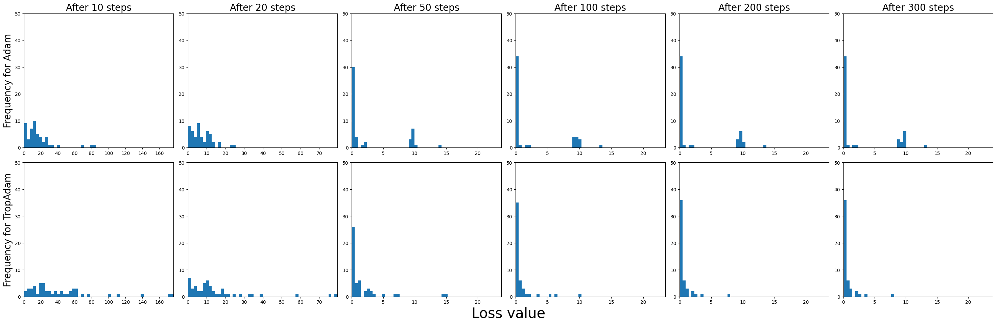

In [303]:
#Plotting histogram of converged value
fig, axs = plt.subplots(No_grad_types,len(iter_list), figsize = (5*len(iter_list),5*No_grad_types))
fig.tight_layout()
ax = fig.add_subplot(111,frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
plt.xlabel("Loss value",fontsize = 30)
#plt.ylabel("Count out of 50",fontsize = 30)

axislims = np.max(np.max(Losses[:,0:2,:], axis = 0), axis = 0)
bin_width = axislims/50

for i in range(len(iter_list)):
        axs[0,i].set_title(f"After {iter_list[i]} steps",fontsize = 20)
        for j in range(No_grad_types):
                axs[j,i].hist(Losses[:,j,iter_list[i]-1], bins = list(np.arange(0,axislims[iter_list[i]-1]+1,bin_width[iter_list[i]-1])))
                axs[j,i].set_xlim([0,axislims[iter_list[i]-1]])
                axs[j,i].set_ylim([0,50])

axs[0,0].set_ylabel(f"Frequency for Adam",fontsize = 20)
axs[1,0].set_ylabel(f"Frequency for TropAdam",fontsize = 20)
#axs[2,0].set_ylabel(f"Frequency for Gradient Descent",fontsize = 20)
#axs[3,0].set_ylabel(f"Frequency for Tropical Descent",fontsize = 20)

fig.tight_layout()

#axs[len(iter_list)-1].legend(prop={'size':20})

plt.savefig('Figures/Adam_Loss_Histogram_2.png')

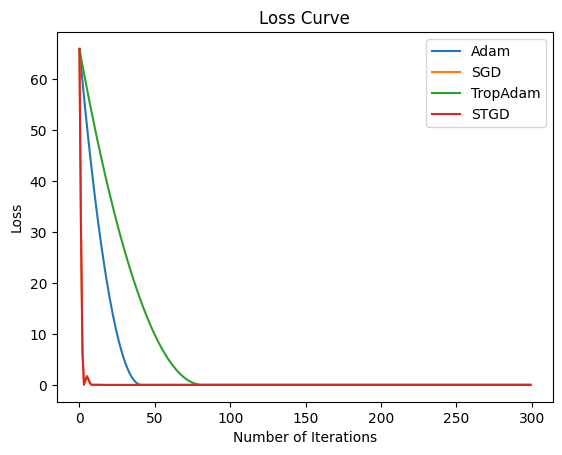

In [ ]:
#Plotting loss curve of candidate run
plt.figure()
plt.plot(Losses[11,0,:], label="Adam")
plt.plot(Losses[11,1,:], label="SGD")
plt.plot(Losses[11,2,:], label="TropAdam")
plt.plot(Losses[11,3,:], label="STGD")

plt.legend()
plt.xlabel("Number of Iterations")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.show()

# Convergence for $p=\infty$

Compare the average steps of three optimizers. To do this, we fix the elements of the underlying tropical matrix to be 0 of given support. 

If either:
- the loss is less than predefined tolerance
- the difference between trained matrix and true matrix is less than the predefined tolerance

we regard as convergence. 

In [32]:
#Defining optimisation functions

# Adam optimizer
def infAdamOP(X, Y, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    if isinstance(lr, list):
        optimizer = optim.Adam([Mat], lr=lr[0], betas=betas)
        def lr_lambda(i):
            return lr[0]/(i+1) 
        scheduler = optim.lr_scheduler.LambdaLR(optimizer,lr_lambda)
    else:
        optimizer = optim.Adam([Mat], lr=lr,betas=betas)

    if verbose:
        # Track loss
        Adam_loss_values = []
        Adam_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            Adam_loss_values.append(loss.item())
            Adam_Mat_values.append(Mat.detach().numpy())
        optimizer.zero_grad()
        loss.backward()
        if isinstance(lr, list):
            scheduler.step()
        else:
            optimizer.step()
        if loss.item() < tol_loss:
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, Adam_loss_values, Adam_Mat_values
    else:
        return step, loss.item()

# SGD optimizer
def infSGDOP(X, Y, Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    if isinstance(lr, list):
        optimizer = optim.SGD([Mat], lr=lr[0], momentum=momentum)
        def lr_lambda(i):
            return lr[0]/(i+1) 
        scheduler = optim.lr_scheduler.LambdaLR(optimizer,lr_lambda)
    else:
        optimizer = optim.SGD([Mat], lr=lr, momentum=momentum)

    if verbose:
        # Track loss
        SGD_loss_values = []
        SGD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            SGD_loss_values.append(loss.item())
            SGD_Mat_values.append(Mat.detach().numpy())
        optimizer.zero_grad()
        loss.backward()
        if isinstance(lr, list):
            scheduler.step()
        else:
            optimizer.step()
        if loss.item() < tol_loss:
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, SGD_loss_values,SGD_Mat_values
    else:
        return step, loss.item()

# RMSprop optimizer
def infRMSpropOP(X, Y, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    optimizer = optim.RMSprop([Mat], lr=lr)

    if verbose:
        # Track loss
        RMSprop_loss_values = []
        RMSprop_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            RMSprop_loss_values.append(loss.item())
            RMSprop_Mat_values.append(Mat.detach().numpy())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if loss.item() < tol_loss:
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, RMSprop_loss_values, RMSprop_Mat_values
    else:
        return step, loss.item()

# TGD optimizer
def infTGDOP(X, Y, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter

    if verbose:
        # Track loss
        TGD_loss_values = []
        TGD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            TGD_loss_values.append(loss.item())
            TGD_Mat_values.append(Mat.detach().numpy())
        loss.backward()
        Mat.data = Mat.data - lr * (Mat.grad.data > 0).float() * (max(Mat.grad.data) - min(Mat.grad.data))
        Mat.grad.data.zero_()
        if loss.item() < tol_loss:
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, TGD_loss_values, TGD_Mat_values
    else:
        return step, loss.item()
    
# Adam optimizer
def infTropAdamOP(X, Y, Mat, lr, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    if isinstance(lr, list):
        optimizer = optim.Adam([Mat], lr=lr[0], betas=betas)
        def lr_lambda(i):
            return lr[0]/(i+1) 
        scheduler = optim.lr_scheduler.LambdaLR(optimizer,lr_lambda)
    else:
        optimizer = optim.Adam([Mat], lr=lr,betas=betas)

    if verbose:
        # Track loss
        TropAdam_loss_values = []
        TropAdam_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            TropAdam_loss_values.append(loss.item())
            TropAdam_Mat_values.append(Mat.detach().numpy())
        optimizer.zero_grad()
        loss.backward()
        Mat.grad.data = (Mat.grad.data > 0).float() * (max(Mat.grad.data) - min(Mat.grad.data))
        if isinstance(lr, list):
            scheduler.step()
        else:
            optimizer.step()
        if loss.item() < tol_loss:
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, TropAdam_loss_values, TropAdam_Mat_values
    else:
        return step, loss.item()
    
# SGD optimizer
def infSTGDOP(X, Y, Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = False):
    N = X.size(dim=1)
    M = Y.size(dim=1)
    step = num_iter
    
    # Create the optimizer
    if isinstance(lr, list):
        optimizer = optim.SGD([Mat], lr=lr[0], momentum=momentum)
        def lr_lambda(i):
            return lr[0]/(i+1) 
        scheduler = optim.lr_scheduler.LambdaLR(optimizer,lr_lambda)
    else:
        optimizer = optim.SGD([Mat], lr=lr, momentum=momentum)

    if verbose:
        # Track loss
        STGD_loss_values = []
        STGD_Mat_values = []

    # Perform gradient descent
    for i in range(num_iter):
        loss = objective_function_infty(X, Y, supp, Mat)
        if verbose:
            STGD_loss_values.append(loss.item())
            STGD_Mat_values.append(Mat.detach().numpy())
        optimizer.zero_grad()
        loss.backward()
        Mat.grad.data = (Mat.grad.data > 0).float() * (max(Mat.grad.data) - min(Mat.grad.data))
        if isinstance(lr, list):
            scheduler.step()
        else:
            optimizer.step()
        if loss.item() < tol_loss:
            step = i
            break
        elif np.ptp(Mat.detach().numpy()) < tol_mat:
            step = i
            break
            
    if verbose:
        return step, STGD_loss_values,STGD_Mat_values
    else:
        return step, loss.item()

In [ ]:
#Setting hyperparameters

num_exps = 50 # number of experiments
n = 10 # number of data
N = 3 # input dimension
M = 2 # output dimension
lr = 0.5
num_iter = 300
momentum = 0.5 #default is 0, range [0,1]
tol_loss = 0.01
tol_mat = 1e-8
iter_list = [10,20,50,100,200,300] 
data_scale = 5
init_scale = 10
No_grad_types = 4
p = 2
beta = ( 0.15, 0.25 )

In [ ]:
#Training beta1 and beta2 for Adam
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = torch.randn(n, M)*5


average_steps = np.zeros((10,10))
a_range = np.linspace(0.05,0.95,10)
b_range = np.linspace(0.05,0.95,10)

for _ in range(10):

    Mat_Init = np.random.rand(N)*init_scale
    for i in range(len(a_range)):
        for j in range(len(b_range)):

            Adam_Mat = torch.tensor(Mat_Init,requires_grad=True)
            step,_ = AdamOP(X, Y, Adam_Mat, lr, (a_range[i],b_range[j]), 100, tol_loss, tol_mat)
            average_steps[i,j] += step/num_exps

#Adam hyperparameter training results
px.imshow(average_steps)

betas = (a_range[np.argmin(average_steps)[0]], b_range[np.argmin(average_steps)[1]])

In [ ]:
#Training momentum for SGD
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = torch.randn(n, M)*5


average_steps = np.zeros(10)
a_range = np.linspace(0.05,0.95,10)

for _ in range(10):

    Mat_Init = np.random.rand(N)*init_scale
    for i in range(len(a_range)):

            SGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
            step,_ = SGDOP(X, Y, SGD_Mat, lr, a_range[i], 100, tol_loss, tol_mat)
            average_steps[i] += step/num_exps

#Adam hyperparameter training results
px.imshow(average_steps)

momentum = a_range[np.argmin(average_steps)]

In [ ]:
#Run optimisation on arbitrary data with random initialisation

#Generate random test data
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = IdProj(X, supp)

infsteps = np.zeros((num_exps,No_grad_types))
infLosses = np.zeros((num_exps,No_grad_types,num_iter))
infMatVals = np.zeros((num_exps,No_grad_types,num_iter,N))

for i in range(num_exps):
    # Initialize variables
    Mat_Init = np.random.rand(N)*init_scale

    Adam_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,0],infAdam_loss_values, infAdam_Mat_Values = infAdamOP(X, Y, Adam_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,0,:] = infAdam_loss_values+([infAdam_loss_values[-1]] * int(num_iter - 1 - infsteps[i,0]))
    infMatVals[i,0,:,:] = infAdam_Mat_Values+([infAdam_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,0]))
    
    SGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,1],infSGD_loss_values, infSGD_Mat_Values = infSGDOP(X, Y, SGD_Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,1,:] = infSGD_loss_values+([infSGD_loss_values[-1]] * int(num_iter - 1 - infsteps[i,1])) 
    infMatVals[i,1,:,:] = infSGD_Mat_Values+([infSGD_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,1]))
    
    # RMSprop_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # infsteps[i,2],infRMSprop_loss_values, infRMSprop_Mat_Values = infRMSpropOP(X, Y, RMSprop_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    # infLosses[i,2,:] = infRMSprop_loss_values+([infRMSprop_loss_values[-1]] * int(num_iter - 1 - infsteps[i,2])) 
    # infMatVals[i,0,:,:] = infRMSprop_Mat_Values+([infRMSprop_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,2]))

    # TGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # infsteps[i,3],infTGD_loss_values, infTGD_Mat_Values = infTGDOP(X, Y, TGD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    # infLosses[i,3,:] = infTGD_loss_values+([infTGD_loss_values[-1]] * int(num_iter - 1 - infsteps[i,3]))
    # infMatVals[i,0,:,:] = infTGD_Mat_Values+([infTGD_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,3]))

    TropAdam_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,2],infTropAdam_loss_values, infTropAdam_Mat_Values = infTropAdamOP(X, Y, TropAdam_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,2,:] = infTropAdam_loss_values+([infTropAdam_loss_values[-1]] * int(num_iter - 1 - infsteps[i,2])) 
    infMatVals[i,2,:,:] = infTropAdam_Mat_Values+([infTropAdam_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,2]))

    STGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,3],infSTGD_loss_values, infSTGD_Mat_Values = infSTGDOP(X, Y, STGD_Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,3,:] = infSTGD_loss_values+([infSTGD_loss_values[-1]] * int(num_iter - 1 - infsteps[i,3]))
    infMatVals[i,3,:,:] = infSTGD_Mat_Values+([infSTGD_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,3])) 

In [ ]:
#Computing average run time
print(np.mean(infsteps,axis=0))

[206.26 300.   110.98 300.   220.94 300.  ]


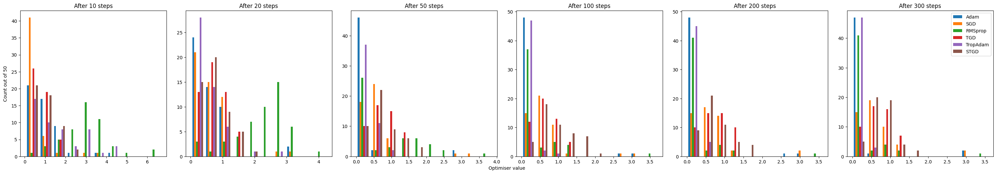

In [ ]:
#Plotting histogram of converged value
fig, axs = plt.subplots(2,len(iter_list), figsize = (5*len(iter_list),10))
fig.tight_layout()
ax = fig.add_subplot(111,frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
plt.xlabel("Optimiser value",fontsize = 30)
plt.ylabel("Count out of 50",fontsize = 30)

axislims = np.max(Losses, axis = 2)

for i in range(len(iter_list)):
        axs[0,i].hist(infLosses[:,[0,2],iter_list[i]-1], label = ['Adam', 'TropAdam'])
        axs[1,i].hist(infLosses[:,[1,3],iter_list[i]-1], label = ['SGD', 'STGD'])
        
        axs[0,i].set_title(f"After {iter_list[i]} steps",fontsize = 20)
        axs[1,i].set_title(f"After {iter_list[i]} steps",fontsize = 20)

axs[0,len(iter_list)-1].legend(prop={'size':20})
axs[1,len(iter_list)-1].legend(prop={'size':20})

fig.tight_layout()

plt.savefig('Figures/Loss_Histogram_Inf.png')

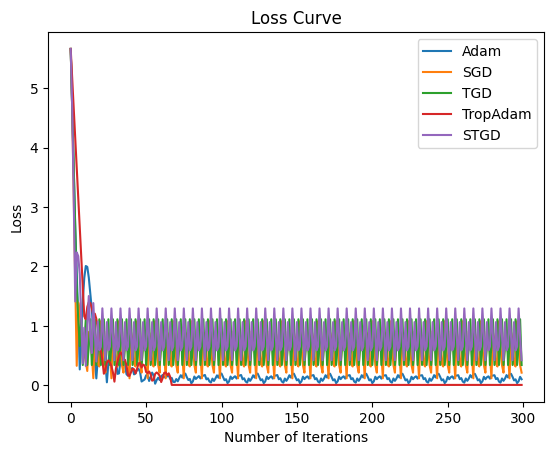

In [ ]:
#Plotting loss curve of candidate run
plt.figure()
plt.plot(infLosses[0,0,:], label="Adam")
plt.plot(infLosses[0,1,:], label="SGD")
#plt.plot(infLosses[0,2,:], label="RMSprop")
#plt.plot(infLosses[0,3,:], label="TGD")
plt.plot(infLosses[0,4,:], label="TropAdam")
plt.plot(infLosses[0,5,:], label="STGD")

plt.legend()
plt.xlabel("Number of Iterations")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.show()

## With harmonic learning rate

In [28]:
#Training hyperparameters again?

In [33]:
#Run optimisation on arbitrary data with random initialisation

lr = [3, 'harmonic']

#Generate random test data
supp = rand_supp(N, M)
X = torch.randn(n, N)*5
Y = IdProj(X, supp)

infsteps = np.zeros((num_exps,No_grad_types))
infLosses = np.zeros((num_exps,No_grad_types,num_iter))
infMatVals = np.zeros((num_exps,No_grad_types,num_iter,N))

for i in range(num_exps):
    # Initialize variables
    Mat_Init = np.random.rand(N)*init_scale

    Adam_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,0],infAdam_loss_values, infAdam_Mat_Values = infAdamOP(X, Y, Adam_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,0,:] = infAdam_loss_values+([infAdam_loss_values[-1]] * int(num_iter - 1 - infsteps[i,0]))
    infMatVals[i,0,:,:] = infAdam_Mat_Values+([infAdam_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,0]))
    
    SGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,1],infSGD_loss_values, infSGD_Mat_Values = infSGDOP(X, Y, SGD_Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,1,:] = infSGD_loss_values+([infSGD_loss_values[-1]] * int(num_iter - 1 - infsteps[i,1])) 
    infMatVals[i,1,:,:] = infSGD_Mat_Values+([infSGD_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,1]))
    
    # RMSprop_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # infsteps[i,2],infRMSprop_loss_values, infRMSprop_Mat_Values = infRMSpropOP(X, Y, RMSprop_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    # infLosses[i,2,:] = infRMSprop_loss_values+([infRMSprop_loss_values[-1]] * int(num_iter - 1 - infsteps[i,2])) 
    # infMatVals[i,0,:,:] = infRMSprop_Mat_Values+([infRMSprop_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,2]))

    # TGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    # infsteps[i,3],infTGD_loss_values, infTGD_Mat_Values = infTGDOP(X, Y, TGD_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    # infLosses[i,3,:] = infTGD_loss_values+([infTGD_loss_values[-1]] * int(num_iter - 1 - infsteps[i,3]))
    # infMatVals[i,0,:,:] = infTGD_Mat_Values+([infTGD_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,3]))

    TropAdam_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,2],infTropAdam_loss_values, infTropAdam_Mat_Values = infTropAdamOP(X, Y, TropAdam_Mat, lr, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,2,:] = infTropAdam_loss_values+([infTropAdam_loss_values[-1]] * int(num_iter - 1 - infsteps[i,2])) 
    infMatVals[i,2,:,:] = infTropAdam_Mat_Values+([infTropAdam_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,2]))

    STGD_Mat = torch.tensor(Mat_Init,requires_grad=True)
    infsteps[i,3],infSTGD_loss_values, infSTGD_Mat_Values = infSTGDOP(X, Y, STGD_Mat, lr, momentum, num_iter, tol_loss, tol_mat, verbose = True)
    infLosses[i,3,:] = infSTGD_loss_values+([infSTGD_loss_values[-1]] * int(num_iter - 1 - infsteps[i,3]))
    infMatVals[i,3,:,:] = infSTGD_Mat_Values+([infSTGD_Mat_Values[-1]] * int(num_iter - 1 - infsteps[i,3])) 

c:\Users\rst17\OneDrive - Imperial College London\WassDistsDiffDim\Github\WassDistsofDiffDim\.venv\Lib\site-packages\torch\optim\lr_scheduler.py:139: UserWarning:

Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate



In [ ]:
#Computing average run time
print(np.mean(infsteps,axis=0))

In [ ]:
#Plotting histogram of converged value
fig, axs = plt.subplots(2,len(iter_list), figsize = (5*len(iter_list),10))
fig.tight_layout()
ax = fig.add_subplot(111,frameon=False)
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
plt.xlabel("Optimiser value",fontsize = 30)
plt.ylabel("Count out of 50",fontsize = 30)

axislims = np.max(Losses, axis = 2)

for i in range(len(iter_list)):
        axs[0,i].hist(infLosses[:,[0,2],iter_list[i]-1], label = ['Adam', 'TropAdam'])
        axs[1,i].hist(infLosses[:,[1,3],iter_list[i]-1], label = ['SGD', 'STGD'])
        
        axs[0,i].set_title(f"After {iter_list[i]} steps",fontsize = 20)
        axs[1,i].set_title(f"After {iter_list[i]} steps",fontsize = 20)

axs[0,len(iter_list)-1].legend(prop={'size':20})
axs[1,len(iter_list)-1].legend(prop={'size':20})

fig.tight_layout()

plt.savefig('Figures/Loss_Histogram_Inf_HarLR.png')

In [ ]:
#Plotting loss curve of candidate run
plt.figure()
plt.plot(infLosses[0,0,:], label="Adam")
plt.plot(infLosses[0,1,:], label="SGD")
#plt.plot(infLosses[0,2,:], label="RMSprop")
#plt.plot(infLosses[0,3,:], label="TGD")
plt.plot(infLosses[0,4,:], label="TropAdam")
plt.plot(infLosses[0,5,:], label="STGD")

plt.legend()
plt.xlabel("Number of Iterations")
plt.ylabel("Loss")
plt.title("Loss Curve")
plt.show()

# Example 1.1 in the note

We have $N = 3, M = 2$ and two data $X=[[0, 3, 0],[4, 1, 0]]$ and $Y=[[3, 0],[4, 0]]$. The support of the tropical matrix is given by $\textrm{supp} = [\{0,1\},\{2\}]$. Initialized the start point uniformly in $[0,4]^3$. An experiment is considered to fail if the objective function is above 2 after maximal number of iterations.

In [ ]:
num_exps = 50 # number of experiments
n = 2 # number of data
N = 3 # input dimension
M = 2 # output dimension
lr = 0.1
momentum = 0.1 #default is 0, range [0,1]

supp = [{0,1},{2}]

# Generate random test data
X = torch.tensor([[0,3,0],[4,1,0]], dtype=torch.float64)
Y = torch.tensor([[3,0],[4,0]], dtype=torch.float64)

In [ ]:
tol_loss = 2
tol_mat = 1e-15
iter_list = [10,20,50,100,200] 
flag_list = []
for num_iter in iter_list:
    fail_flag = 0
    for i in range(num_exps):
        Mat_Init = np.random.uniform(low=0, high=4, size=N)
        Adam_Mat = torch.tensor(Mat_Init,requires_grad=True)
        step, loss = AdamOP(X, Y, Adam_Mat, lr, num_iter, tol_loss, tol_mat)
        if step == num_iter:
            fail_flag += 1
    print(loss)
    flag_list.append(fail_flag)
    
print(flag_list)

1.9083876597074436
1.8453952134743332
1.2270504199855878
1.7500567189150047
0.07198947419409762
[4, 1, 1, 0, 3]
